# Data preparing


### **Introduction**

Contains the responses of a gas multisensor device deployed on the field in an Italian city. Hourly responses averages are recorded along with gas concentrations references from a certified analyzer.

The [dataset](https://archive.ics.uci.edu/dataset/360/air+quality)

### Description of Air Quality Measurements Dataset

The dataset contains 9358 instances of hourly averaged responses from an array of 5 metal oxide chemical sensors embedded in an Air Quality Chemical Multisensor Device. The device was located on the field in a significantly polluted area, at road level,within an Italian city. Data were recorded from March 2004 to February 2005 (one year)representing the longest freely available recordings of on field deployed air quality chemical sensor devices responses. Ground Truth hourly averaged concentrations for CO, Non Methanic Hydrocarbons, Benzene, Total Nitrogen Oxides (NOx) and Nitrogen Dioxide (NO2)  and were provided by a co-located reference certified analyzer. Evidences of cross-sensitivities as well as both concept and sensor drifts are present as described in De Vito et al., Sens. And Act. B, Vol. 129,2,2008 (citation required) eventually affecting sensors concentration estimation capabilities. Missing values are tagged with -200 value.
This dataset can be used exclusively for research purposes. Commercial purposes are fully excluded.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pylab import rcParams
import seaborn as sns
rcParams['figure.figsize']=10,8
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import datetime

**Exploratory Data Analysis**

Load Air Quality Dataset

In [ ]:
# load the data from the google drive.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# setup the file path and name
file_path = '/content/drive/MyDrive/Murdoch/ICT606/air_quality.xlsx'
sheet_name = 'AirQualityUCI'
# will loca the max rows are 9358
max_rows = 9358
df=pd.read_excel(file_path,sheet_name=sheet_name, engine='openpyxl', nrows=max_rows)


In [3]:
# Basic information about the dataset
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   int64         
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
dtypes: datetime64[ns](1),

In [4]:
# Ensure both Date and Time are in string format for safe concatenation
# It seems the Time column might not need conversion if it's already a string representing time.
# The error message might be from an attempt in a different context or a misinterpretation.

# A safer approach would be to explicitly convert both to strings and then to datetime:
df['DateTime'] = pd.to_datetime(df['Date'].astype(str) + ' ' + df['Time'].astype(str))

# Set the new DateTime column as the index of the dataframe, if desired
df.set_index('DateTime', inplace=True)

# Display the first few rows to verify the changes
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
DateTime,,,,,,,,,,,,,,,
2004-03-10 18:00:00,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
2004-03-10 19:00:00,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2004-03-10 20:00:00,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
2004-03-10 21:00:00,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
2004-03-10 22:00:00,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [5]:
# Summary statistics for numerical features
df.describe()

,Date,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2004-09-21 04:30:05.193972480,-34.207524,1048.869652,-159.090093,1.865576,894.475963,168.604200,794.872333,58.135898,1391.363266,974.951534,9.776600,39.483611,-6.837604
min,2004-03-10 00:00:00,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,2004-06-16 00:00:00,0.600000,921.000000,-200.000000,4.004958,711.000000,50.000000,637.000000,53.000000,1184.750000,699.750000,10.950000,34.050000,0.692275
50%,2004-09-21 00:00:00,1.500000,1052.500000,-200.000000,7.886653,894.500000,141.000000,794.250000,96.000000,1445.500000,942.000000,17.200000,48.550000,0.976823
75%,2004-12-28 00:00:00,2.600000,1221.250000,-200.000000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223
max,2005-04-04 00:00:00,11.900000,2039.750000,1189.000000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036
std,NaN,77.657170,329.817015,139.789093,41.380154,342.315902,257.424561,321.977031,126.931428,467.192382,456.922728,43.203438,51.215645,38.976670


In [6]:
# First few rows of the dataset
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
DateTime,,,,,,,,,,,,,,,
2004-03-10 18:00:00,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
2004-03-10 19:00:00,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2004-03-10 20:00:00,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
2004-03-10 21:00:00,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
2004-03-10 22:00:00,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


**Checking and Handling Missing Data**

In [7]:
# Replace missing value placeholders with NaN
df.replace(-200, np.nan, inplace=True)

In [8]:
# Count the number of NaN values in each column of the DataFrame (DF).
nan_counts = df.isna().sum()

# To display the count of NaN values for each column
print(nan_counts)

# If you want to get the total number of NaN values across the entire DataFrame (DF).
total_nan_count = df.isna().sum().sum()
print(f"Total number of NaN values in the DataFrame: {total_nan_count}")

Date                0
Time                0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64
Total number of NaN values in the DataFrame: 16701


High Missing Values
1.	NMHC(GT) has 8443 missing values, which is a substantial portion of the dataset. Given the high percentage of missing data:
2.	Consider Dropping: If NMHC(GT) is not critical for your analysis or predictions, consider dropping this variable.
3.	Expert Input: If it's crucial, consult subject matter experts to understand potential imputation strategies or use predictive modeling to estimate missing values, though this could be complex and uncertain.

Moderate Missing Values
1.	CO(GT), NOx(GT), and NO2(GT) have significant but less extreme counts of missing values (1683, 1639, and 1642, respectively). For these:
2.	Imputation: For continuous variables, impute missing values using the median or mean of each column, which can be a reasonable approach if the missing data is assumed to be randomly distributed.
3.	Predictive Imputation: Use regression or machine learning models to predict missing values based on other variables in the dataset.

Low Missing Values
1.	PT08.S1(CO), C6H6(GT), PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), PT08.S5(O3), T, RH, AH all have 366 missing values, which is more manageable:
2.	Simple Imputation: For these variables, simple imputation methods (mean, median, or mode) could be appropriate and would not significantly distort the data distribution.
3.	Time Series Analysis: If the data is time-dependent, consider using time series imputation methods, such as forward fill or backward fill, to maintain temporal consistency.

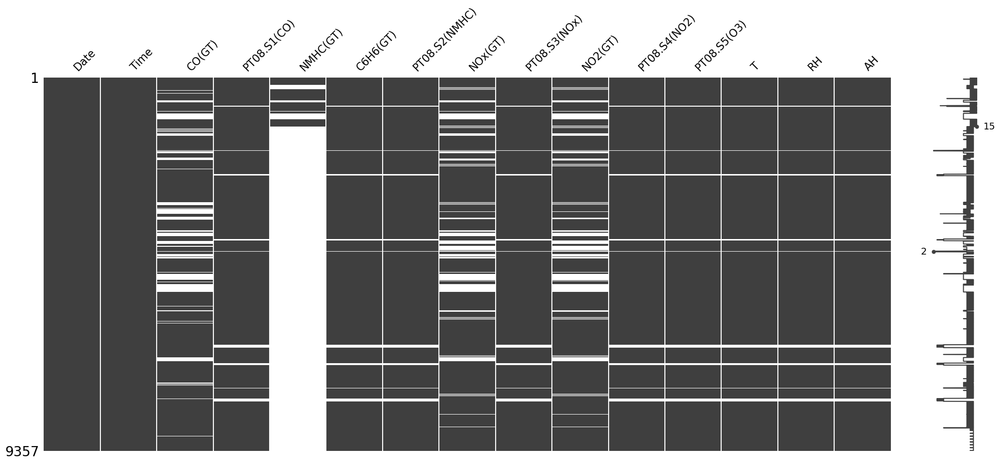

In [9]:
!pip install missingno

import missingno as msno
import matplotlib.pyplot as plt

# Visualising the missingness pattern in the dataset
msno.matrix(df)
plt.show()

### Interpretation of 'missingno' matrix

**NMHC(GT)**: This column has a very distinct pattern of missingness with large continuous blocks of white, indicating many consecutive missing values. This suggests a systematic issue, possibly with the sensor or data recording process for NMHC during those periods.

**Other Columns with Uniform Missingness**: Other columns, such as ***CO(GT), NOx(GT), and NO2(GT)***, show substantial missingness with some degree of uniformity, which may point towards systematic missingness. These could be related to similar factors affecting NMHC(GT) or other operational aspects like sensor malfunctions or maintenance periods where multiple sensors are affected simultaneously.

**Columns with Sporadic Missingness**: Some columns, such as ***C6H6(GT), PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), PT08.S5(O3), T, RH, and AH***, also have missing values, but the missingness seems less extensive and less systematic compared to NMHC(GT). The missing data in these columns are more sporadic and less patterned, which might suggest that the missingness is not completely systematic but could still have some underlying patterns possibly related to the time of day, seasonality, or other factors not directly related to sensor issues.

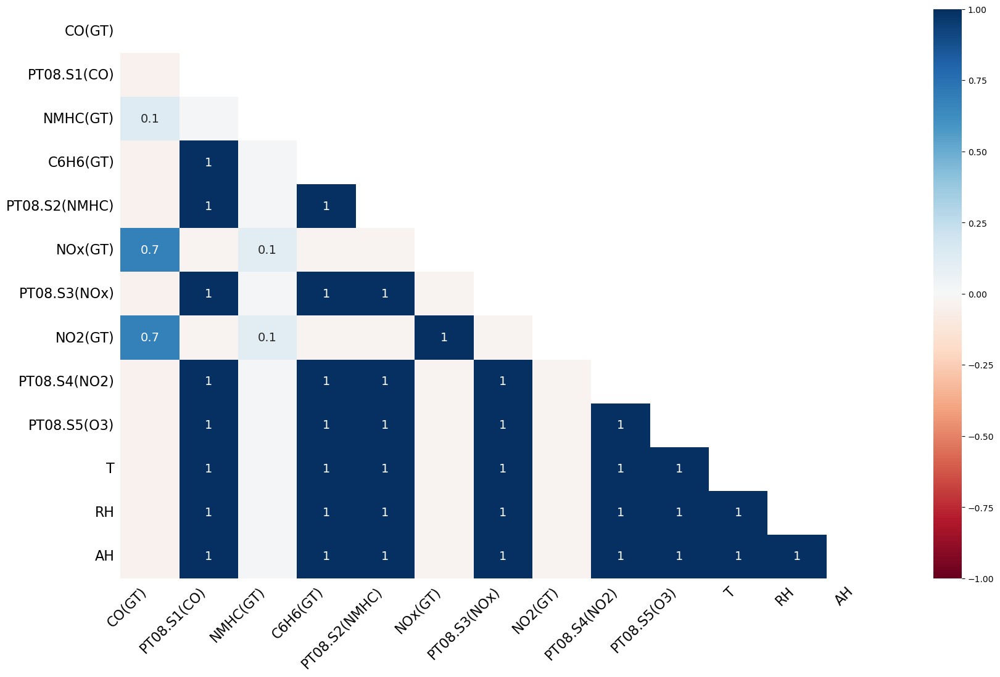

In [10]:
# Heatmap to show the correlation of missingness between different columns
msno.heatmap(df)
plt.show()

### Interpretation of 'missingno' heatmap

Variables that have low or no correlation in missingness with other variables indicate that the missingness may be sporadic or random.  This means there isn’t a discernible pattern to when these values are missing compared to others.

**NMHC(GT)**: Shows a light colour in its row and column, which means it has low correlations with missingness in other variables (close to ‘0.1’).  This missing data in **NMHC(GT)** appears to be independent of the missing data in most other variables, which may therefore suggest that the missingness here is more sporadic or random.

**PT08.S1(CO), C6H6(GT), PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), PT08.S5(O3), T, RH, and AH**: If these have similarly light colours in their respective rows and columns, it will indicate that there missingness does not strongly correlate with the missingness of other variables, suggesting a more sporadic pattern of missing data

In [11]:
import pandas as pd
from scipy.interpolate import PchipInterpolator
import numpy as np

# Ensure the DataFrame index is sorted
df.sort_index(inplace=True)

# Assuming 'df' is the DataFrame and it has a numeric index
# If your DataFrame has a DateTimeIndex, you can convert it to numeric like this:
# df.index = (df.index - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')

# Combine all the features including 'NMHC(GT)'
features_to_interpolate = [
    'PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)',
    'PT08.S5(O3)', 'NOx(GT)', 'NO2(GT)', 'CO(GT)', 'NMHC(GT)'
]

# Function to perform PCHIP interpolation on a series
def pchip_interpolate(series):
    # Create a boolean array where True indicates non-missing values
    non_missing = ~series.isna()

    # Create an index array (if your index is not already numeric)
    index_array = np.arange(len(series))

    # Interpolate only if there are at least two non-missing values
    if non_missing.sum() >= 2:
        # Perform PCHIP interpolation
        interpolator = PchipInterpolator(index_array[non_missing], series[non_missing])
        interpolated_values = interpolator(index_array)
        return pd.Series(interpolated_values, index=series.index)
    else:
        # If not enough data points, return the original series
        return series

# Apply PCHIP interpolation to each feature
for feature in features_to_interpolate:
    df[feature] = pchip_interpolate(df[feature])

# Now 'df' has the interpolated values for the specified features

In [12]:
# Count the number of NaN values in each column of the DataFrame (DF).
nan_counts = df.isna().sum()

# To display the count of NaN values for each column
print(nan_counts)

# If you want to get the total number of NaN values across the entire DataFrame (DF).
total_nan_count = df.isna().sum().sum()
print(f"Total number of NaN values in the DataFrame: {total_nan_count}")

Date               0
Time               0
CO(GT)             0
PT08.S1(CO)        0
NMHC(GT)           0
C6H6(GT)         366
PT08.S2(NMHC)      0
NOx(GT)            0
PT08.S3(NOx)       0
NO2(GT)            0
PT08.S4(NO2)       0
PT08.S5(O3)        0
T                366
RH               366
AH               366
dtype: int64
Total number of NaN values in the DataFrame: 1464


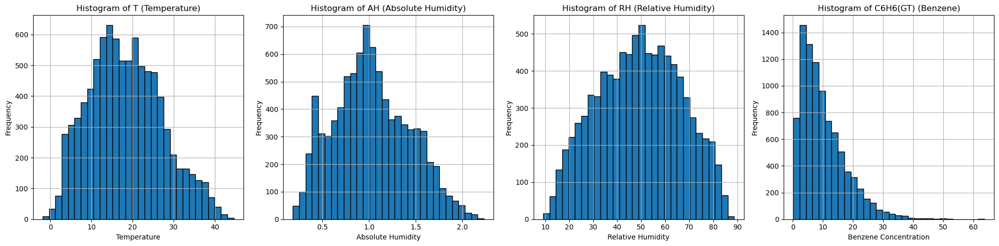

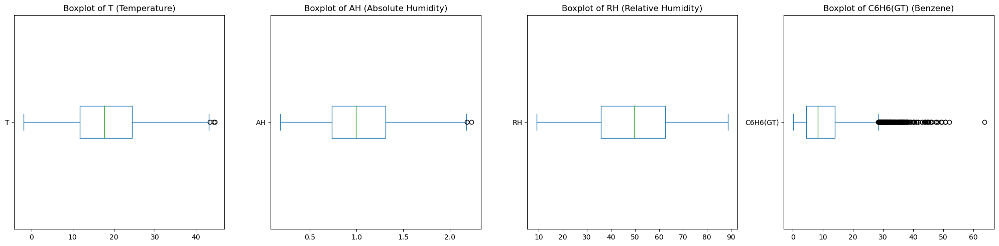

In [13]:
import matplotlib.pyplot as plt

# Replace 'df' with the actual variable name of your DataFrame containing the data
# df = ... (load your DataFrame here)

# Histograms for T, AH, RH, and C6H6
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
df['T'].dropna().hist(bins=30, edgecolor='black')
plt.title('Histogram of T (Temperature)')
plt.xlabel('Temperature')
plt.ylabel('Frequency')

plt.subplot(1, 4, 2)
df['AH'].dropna().hist(bins=30, edgecolor='black')
plt.title('Histogram of AH (Absolute Humidity)')
plt.xlabel('Absolute Humidity')
plt.ylabel('Frequency')

plt.subplot(1, 4, 3)
df['RH'].dropna().hist(bins=30, edgecolor='black')
plt.title('Histogram of RH (Relative Humidity)')
plt.xlabel('Relative Humidity')
plt.ylabel('Frequency')

plt.subplot(1, 4, 4)
df['C6H6(GT)'].dropna().hist(bins=30, edgecolor='black')
plt.title('Histogram of C6H6(GT) (Benzene)')
plt.xlabel('Benzene Concentration')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Box plots for T, AH, RH, and C6H6
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
df['T'].dropna().plot(kind='box', vert=False)
plt.title('Boxplot of T (Temperature)')

plt.subplot(1, 4, 2)
df['AH'].dropna().plot(kind='box', vert=False)
plt.title('Boxplot of AH (Absolute Humidity)')

plt.subplot(1, 4, 3)
df['RH'].dropna().plot(kind='box', vert=False)
plt.title('Boxplot of RH (Relative Humidity)')

plt.subplot(1, 4, 4)
df['C6H6(GT)'].dropna().plot(kind='box', vert=False)
plt.title('Boxplot of C6H6(GT) (Benzene)')

plt.tight_layout()
plt.show()

### Interpretation of Histogram and Boxplot for Temperature (T), Absolute Humidity (AH), and Relative Humidity (RH) ###

Given the histograms and boxplots for Temperature (T), Absolute Humidity (AH), and Relative Humidity (RH), we can interpret them as follows:

- **Temperature (T):**

    - Histogram: The histogram for temperature appears to be roughly bell-shaped, indicating a normal distribution. However, there is a slight right skewness, as the tail on the right side is longer.

    - Boxplot: The boxplot shows a few outliers on the higher end, as indicated by circles beyond the upper whisker. The central box and whiskers seem to be symmetrically distributed, reinforcing the idea of a roughly normal distribution with some high-end outliers.
    
- **Absolute Humidity (AH):**

    - Histogram: The histogram for absolute humidity also appears to be bell-shaped with a central peak and symmetry around it, suggesting normality. There is a small indication of right skewness.

    - Boxplot: There are outliers on the higher end, similar to the temperature boxplot. The box and whiskers are relatively symmetrical, aligning with the histogram's indication of a roughly normal distribution.

- **Relative Humidity (RH):**

    - Histogram: The relative humidity histogram shows a more uniform distribution but with a slight peak, which could suggest a near-normal distribution. It does not show significant skewness.

    - Boxplot: The boxplot for relative humidity does not indicate any outliers, and the distribution seems symmetrical. This aligns with the histogram and suggests that the relative humidity data is fairly normally distributed without significant outliers.
    
- **C6H6(GT):**
    
    - Histogram: The histogram for C6H6(GT) shows a right-skewed distribution with a peak at the lower concentrations, indicating that most of the data points are clustered around lower benzene concentration values.
    - The long tail to the right suggests that there are relatively fewer observations with higher benzene concentrations, which is typical for environmental pollutant data where high pollution events are less frequent.

    - Boxplot: The boxplot confirms the right-skewed nature of the data, with the median line closer to the first quartile than the third quartile.
    - There is a significant number of outliers on the higher end, as indicated by individual points beyond the upper whisker. This is consistent with the right skew observed in the histogram.
    - The presence of outliers is characteristic of environmental data, where certain conditions can lead to occasional spikes in pollutant concentrations.

**Assessment of Normality and Outliers:**

  - Normality: None of the variables perfectly fit a normal distribution. T and AH show slight right-skewness but are close to normal, RH appears to be the most normally distributed, and C6H6(GT) is significantly skewed.

  - Outliers: T and AH have some outliers, RH has none, and C6H6(GT) has many, which is expected due to the nature of environmental pollutant data.

  - Imputation Strategy: Given the presence of outliers, particularly in the pollutant data, median imputation is recommended for T, AH, and C6H6(GT) to avoid the influence of extreme values. For RH, which appears to be normally distributed and without significant outliers, the mean could be a suitable imputation method.

These assessments should guide the imputation strategy, ensuring that the chosen method is appropriate for the distribution characteristics of each feature. For statistical confirmation of normality, one could perform formal tests like the Shapiro-Wilk test. However, given the visual evidence, such tests would likely confirm the non-normality for T, AH, and especially C6H6(GT).

In [14]:
# Assuming 'df' is your DataFrame containing the data with columns 'T', 'AH', 'RH', and 'C6H6(GT)'
# Replace 'df' with the actual variable name of your DataFrame

# Calculate the median for Temperature (T), Absolute Humidity (AH), and Benzene (C6H6(GT))
median_T = df['T'].median()
median_AH = df['AH'].median()
median_C6H6 = df['C6H6(GT)'].median()

# Calculate the mean for Relative Humidity (RH)
mean_RH = df['RH'].mean()

# Perform the imputation
df['T'].fillna(median_T, inplace=True)
df['AH'].fillna(median_AH, inplace=True)
df['C6H6(GT)'].fillna(median_C6H6, inplace=True)
df['RH'].fillna(mean_RH, inplace=True)

# Now the DataFrame 'df' has the missing values imputed for 'T', 'AH', 'RH', and 'C6H6(GT)'

In [15]:
# Count the number of NaN values in each column of the DataFrame
nan_counts = df.isna().sum()

# To display the count of NaN values for each column
print(nan_counts)

# If you want to get the total number of NaN values across the entire DataFrame
total_nan_count = df.isna().sum().sum()
print(f"Total number of NaN values in the DataFrame: {total_nan_count}")

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64
Total number of NaN values in the DataFrame: 0


## 2c(i) Univariate Analysis: Histogram and Boxplots of all features

For the univariate analysis, we would like to investigate whether there are normality on all the individual features (air pollutants, particulate matters, and environmental conditions). To test for normality, we will be using histogram, Kolmogorov-Smirnov (K-S) with the aid of D Statistics and p-values, and Q-Q plot. 

The boxplot that is plotted next to the histogram are meant to check for outliers. 

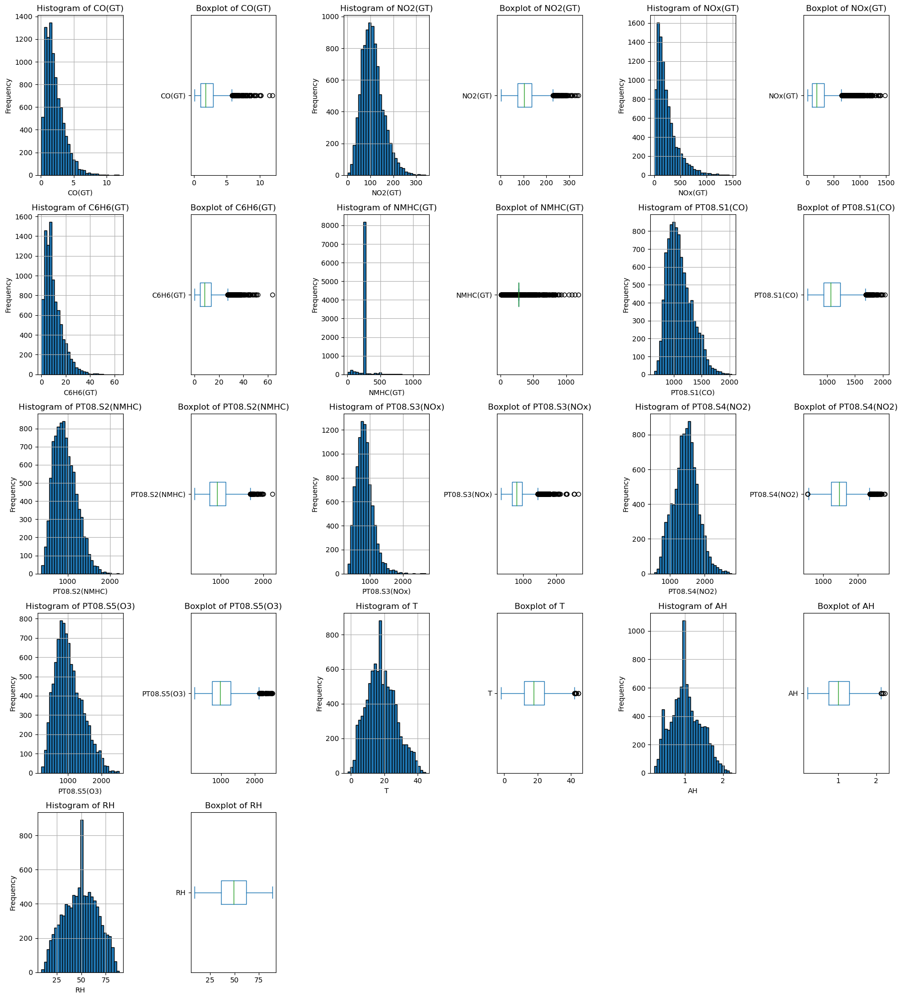

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Replace 'df' with the actual variable name of your DataFrame containing the data

# Define the different categories of features
air_pollutants = ['CO(GT)', 'NO2(GT)', 'NOx(GT)', 'C6H6(GT)', 'NMHC(GT)']
particulate_matters = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
environmental = ['T', 'AH', 'RH']

# Combine all features into one list for plotting
all_features = air_pollutants + particulate_matters + environmental

# Prepare the figure layout
n_features = len(all_features)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

# Create subplots in a facet grid manner
fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(n_cols * 6, n_rows * 4))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over each feature and create the plots
for i, col in enumerate(all_features):
    # Histogram
    df[col].dropna().hist(ax=axes[i * 2], bins=30, edgecolor='black')
    axes[i * 2].set_title(f'Histogram of {col}')
    axes[i * 2].set_xlabel(col)
    axes[i * 2].set_ylabel('Frequency')

    # Boxplot
    df[col].dropna().plot(kind='box', ax=axes[i * 2 + 1], vert=False)
    axes[i * 2 + 1].set_title(f'Boxplot of {col}')

# Hide any unused axes
for j in range(i * 2 + 2, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## Interpretation and EDA Insights of Histogram and Boxplots

### _Interpretation and EDA insights from Histogram for all features_

**Carbon Monoxide (CO(GT)):**
  - The histogram shows a right-skewed distribution, with the majority of the data points clustered near the lower end of the CO(GT) scale.
- There's a long tail extending to the higher values, indicating the presence of extreme higher values or spikes in the CO(GT) measurements.

**Nitrogen Dioxide (NO2(GT)):**
- The histogram shows a distribution that is approximately normal but with a slight right skew, as the tail extends more to the right.
- The highest frequency of values falls in the mid-range bins, with the peak around 100-120 µg/m³.
- The frequency of low values (left side of the histogram) appears to be less than the frequency of mid-range values but more than the high values.
- The gradual decline in frequency as the values increase suggests that high NO2(GT) levels are less common than moderate or low levels.

**Nitrogen Oxides (NOx(GT)):**
- A right-skewed distribution, which is typical for environmental data, especially pollutant concentrations. This indicates that low to moderate NOx concentrations occur more frequently than high concentrations.
- A long tail to the right in the histogram suggests that there are occasional extremely high readings.

**Benzene (C6H6(GT)):**
- The histogram suggests a right-skewed distribution, meaning most of the benzene concentration values are on the lower side, with a tail extending towards the higher concentrations.
- The peak of the histogram indicates the mode of the data, which is the most frequently occurring value range.
- The skewness indicates that while most of the time the concentration levels are low, there are occasions with significantly higher levels.

**Particulate Matter - Carbon monoxide (PT08.S1(CO)):**
- The histogram displays a bell-shaped curve, which suggests a normal-like distribution for the sensor readings.
- The distribution is slightly left-skewed, as the left tail is slightly longer and the peak is not centered but leans to the right.

**Particulate Matter - Non-methanic hydrocarbons (PT08.S2(NMHC))**
- The histogram likely shows a right-skewed distribution, as indicated by the tail extending towards the higher sensor response values.
- Most of the data points are concentrated on the lower end, suggesting lower hourly averaged sensor responses (presumably for NMHC) are more common.
- The skewness might indicate that high NMHC levels occur less frequently but may have significant peaks, which could be related to specific events or conditions causing increased emissions.

**Non-methanic Hydrocarbons - NMHC(GT):**
- The histogram shows a distribution that is heavily skewed to the right. The majority of NMHC(GT) values are concentrated near the lower end of the scale, which suggests that high NMHC levels are not common.
- There is a sharp peak at the lowest range of NMHC values, indicating a mode in the data where most readings fall.

### _Interpretation and EDA insights from Boxplots for all features_
  
**Carbon Monoxide (CO(GT)):**
- The boxplot confirms the right skewness indicated by the histogram, with the median closer to the lower quartile than the upper quartile.
- A significant number of outliers are visible beyond the upper whisker, which are consistent with the long tail seen in the histogram.
- The interquartile range (IQR) is narrow, showing that the middle 50% of the data points are relatively close together.

**Nitrogen Dioxide (NO2(GT)):**
- The median is indicated by the line within the box, which appears to be just above 100 µg/m³.
- The interquartile range (IQR), represented by the box, is relatively compact, suggesting that the middle 50% of the data is clustered within a narrower range of NO2(GT) levels.
- The whiskers extend to include the majority of the data, but there is a notable number of outliers on the right, which are individual values that fall outside the expected range.
- These outliers indicate occasional high-value occurrences of NO2(GT) which are significantly above the rest.

**Nitrogen Oxides (NOx(GT)):**
- The median line is likely closer to the lower end of the box, which is characteristic of a right-skewed distribution.
- There are probably many data points (outliers) beyond the upper whisker, representing rare but significant spikes in NOx levels.
- The interquartile range (IQR), represented by the box, is where the middle 50% of values lie, and if the box is short, most of the NOx values are within a relatively small range.

**Benzene (C6H6(GT)):**
- The boxplot shows a median that is closer to the lower quartile, reinforcing the right-skewed nature of the data.
- The presence of many outliers on the right suggests that there are numerous instances where the benzene concentration is much higher than the typical levels.
- The interquartile range (IQR) appears to be narrow, suggesting that the middle 50% of the data is relatively closely packed together.

**Particulate Matter - Carbon monoxide (PT08.S1(CO)):**
- The boxplot shows that the median value is located to the right of the center of the box, which aligns with the left skew observed in the histogram.
- There are numerous outliers on the higher end, as indicated by the points past the right whisker. These outliers represent instances where the sensor detected unusually high levels of CO.

**Particulate Matter - Non-methanic hydrocarbons (PT08.S2(NMHC))**
- The boxplot likely shows a relatively small interquartile range (IQR), with a median that is closer to the first quartile than the third, consistent with a right-skewed distribution.
- There may be several outliers on the higher end, as indicated by individual points beyond the whiskers. These outliers represent times when the sensor response was particularly high.

**Non-methanic Hydrocarbons - NMHC(GT):**
- The boxplot for NMHC(GT) indicates a median that is close to the lower quartile due to the right skew observed in the histogram.
- There are numerous outliers on the higher end, as indicated by the points beyond the upper whisker. These outliers signify occasional high readings of NMHC(GT).
- The spread of the main body of the data (the box) is very narrow, showing that a large portion of the data falls within a small range.

### _Overall EDA Insights_

**Carbon Monoxide (CO(GT)):**

- **Central Tendency**: The central tendency, as indicated by the median, is towards the lower range of CO(GT) values, which is expected in a typical urban environment where very high CO levels are not constant.
- **Variability**: While there's a high frequency of lower CO values, there's also substantial variability in the data due to the presence of higher values, as indicated by the long tail in the histogram.
- **Outliers**: The outliers suggest that there are occasional periods with significantly higher CO levels, which could be due to various factors such as traffic congestion, industrial emissions, or atmospheric conditions affecting pollutant dispersion.

**Nitrogen Dioxides (NO2(GT)):**
- **Frequency and Occurrence of Low or High Values**:
    - Low values of NO2(GT) seem to be frequent but less so than the median range. This could be due to factors such as atmospheric conditions that reduce NO2 levels, like rain or wind, or the absence of NO2 emission sources.
    - High values occur less frequently but are noteworthy because they are significant in number (visible from the outliers in the boxplot). These could be caused by factors such as traffic congestion, industrial emissions, or thermal inversions that trap pollutants near the ground.
- **Environmental Impact**:
    - NO2 is a significant air pollutant with a variety of environmental and health impacts. It can lead to the formation of ground-level ozone and contribute to the formation of particulate matter.
    - Frequent low levels of NO2 are generally desirable and indicate good air quality.
    - The occurrence of high NO2 levels, even if less frequent, is a concern because they can exacerbate respiratory diseases and affect the most vulnerable populations such as children and the elderly.
    - Episodes of high NO2 can also contribute to acid rain, eutrophication of water bodies, and loss of biodiversity.

**Nitrogen Dioxides (NO2(GT)):**
- **Frequency of Low Values** : Most of the NOx(GT) measurements are low to moderate, which could be due to effective pollution control measures or the nature of the sampling area.
- **Occurrence of High Values**: The high-value outliers indicate episodes of increased NOx emissions, which could be related to traffic congestion, industrial activity, or other combustion processes.

**Benzene (C6H6(GT)):**
- The frequency of low-value occurrences is high, suggesting benzene levels are generally low.
- High-value occurrences, while less frequent, could represent episodes of high pollution and could be a concern for environmental health.
- The environmental impact of high benzene levels can be significant, as it is a known carcinogen, and such outliers may indicate pollution events that require further investigation.

**Particulate Matter - Carbon monoxide (PT08.S1(CO)):**
- **Central Tendency**: The central tendency, as indicated by the median, is somewhat higher than the middle of the data range, which might suggest that the sensor often detects moderate to high levels of CO.
- **Variability**: The data has a moderate spread, with a concentration of values in the middle range, but there's a noticeable frequency of values that are quite far from the median, which could indicate varying environmental conditions or emission sources.
- **Outliers**: The presence of a significant number of high-end outliers could be due to various factors, such as changes in traffic patterns, industrial activities, or other sources of CO emissions. It's also possible that these outliers could be due to sensor malfunctions or other anomalies.

**Particulate Matter - Non-methanic hydrocarbons (PT08.S2(NMHC))**
- **Frequency and Occurrences**: The higher frequency of lower values suggests that NMHC levels are typically lower, with occasional spikes. This could be due to typical ambient air conditions, punctuated by sporadic pollution events.
- **Environmental Impact**: Persistent or frequent high NMHC levels can be concerning as NMHCs contribute to the formation of ground-level ozone and smog, which have health and environmental impacts. The presence of outliers could indicate pollution events that may warrant further investigation.

**Non-methanic Hydrocarbons - NMHC(GT):**
- **Central Tendency**: The central tendency of the data is at the lower end of the scale, with most readings being low for NMHC(GT).
- **Variability**: Despite the majority of low readings, the data exhibits a wide variability due to the presence of very high NMHC(GT) values, albeit infrequently.
- **Outliers**: The numerous high-end outliers could represent occasional spikes in NMHC concentrations, which might be associated with specific environmental events or emission sources.

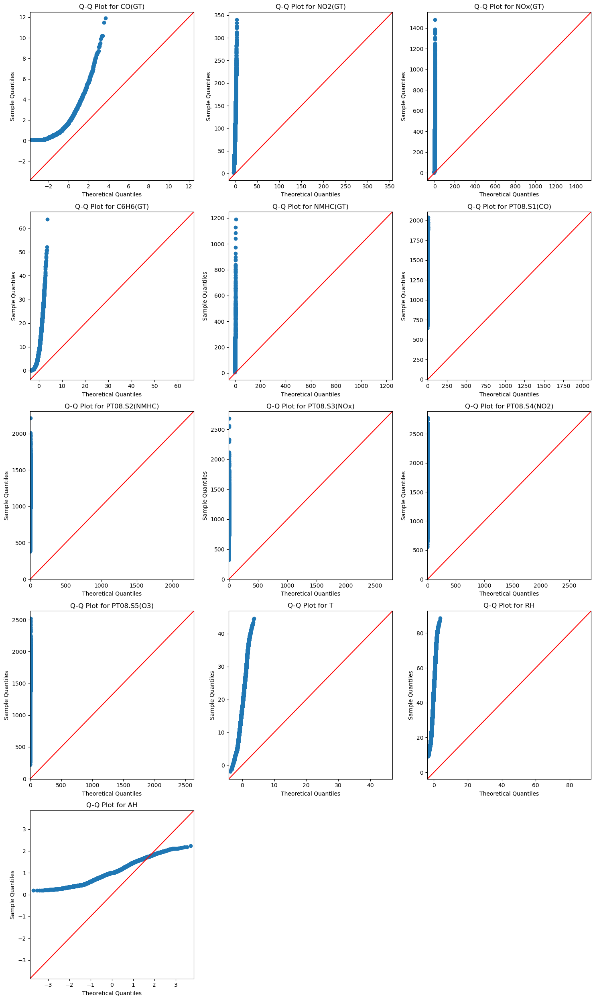

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Assuming 'df' is your DataFrame with the data for each feature.
# Replace the column names with the actual column names of your features.
feature_names = ['CO(GT)', 'NO2(GT)', 'NOx(GT)', 'C6H6(GT)', 
                 'NMHC(GT)', 'PT08.S1(CO)', 'PT08.S2(NMHC)', 
                 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 
                 'T', 'RH', 'AH']

# Calculate the number of rows needed for the subplots (3 plots per row)
num_features = len(feature_names)
num_rows = (num_features + 2) // 3  # Add 2 for rounding up the division

# Create a figure and axes with a subplot for each feature
fig, axs = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))

# Flatten the array of axes for easy iteration
axs = axs.flatten()

# Create Q-Q plots for each feature
for i, feature in enumerate(feature_names):
    sm.qqplot(df[feature], line='45', ax=axs[i])
    axs[i].set_title(f'Q-Q Plot for {feature}')

# If there are any subplots not used (if the number of features is not a multiple of 3), hide them
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

### Interpretation of the Q-Q Plots for all Features (air pollutants and environmental conditions)

CO(GT): The points significantly deviate from the line, particularly towards the tails, suggesting that the data is not normally distributed and is right-skewed.

NO2(GT) and NOx(GT): The points at the lower end deviate from the line, indicating a right-skewness, where the lower values are not as spread out as would be expected in a normal distribution.

C6H6(GT), NMHC(GT), PT08.S1(CO), PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), and PT08.S5(O3): These plots show a curvature away from the normal line, especially at the lower quantiles, suggesting that the data is right-skewed.

T: This plot has a slight deviation from the line at the lower tail, but it's closer to normality compared to the others. There might be slight left-skewness.

RH: The points at the lower end deviate from the line, suggesting a left-skewness where the lower values are not as spread out as would be expected in a normal distribution.

AH: The points, especially at the ends, deviate significantly from the line, suggesting the data is not normally distributed and exhibits right-skewness.

In [20]:
from scipy import stats

# Kolmogorov-Smirnov Test
def kolmogorov_smirnov_test(df, feature_name):
    stat, p_value = stats.kstest(df[feature_name], 'norm', args=(df[feature_name].mean(), df[feature_name].std()))
    print(f"Kolmogorov-Smirnov Test for {feature_name}: Stat={stat}, p-value={p_value}")


features_to_test = ['CO(GT)', 'NO2(GT)', 'NOx(GT)', 'C6H6(GT)', 'NMHC(GT)','PT08.S1(CO)',
                   'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH', 'RH']

for feature in features_to_test:
    kolmogorov_smirnov_test(df, feature)

Kolmogorov-Smirnov Test for CO(GT): Stat=0.11081306690261872, p-value=1.572302958230644e-100
Kolmogorov-Smirnov Test for NO2(GT): Stat=0.053254060779227785, p-value=1.6686646138721543e-23
Kolmogorov-Smirnov Test for NOx(GT): Stat=0.1353448880623705, p-value=5.939244947112687e-150
Kolmogorov-Smirnov Test for C6H6(GT): Stat=0.1183016883037053, p-value=1.471619017643496e-114
Kolmogorov-Smirnov Test for NMHC(GT): Stat=0.43971105179165487, p-value=0.0
Kolmogorov-Smirnov Test for PT08.S1(CO): Stat=0.06670011816628718, p-value=1.2267070717967124e-36
Kolmogorov-Smirnov Test for PT08.S2(NMHC): Stat=0.04909029326717229, p-value=4.908290380450761e-20
Kolmogorov-Smirnov Test for PT08.S3(NOx): Stat=0.05951473169153321, p-value=2.982163727643382e-29
Kolmogorov-Smirnov Test for PT08.S4(NO2): Stat=0.017212155325879414, p-value=0.007729280066758605
Kolmogorov-Smirnov Test for PT08.S5(O3): Stat=0.06390705447586176, p-value=1.1480123355208107e-33
Kolmogorov-Smirnov Test for T: Stat=0.04529493442913657, p

### Interpretation of Kolmogorov-Smirnov (K-S) test with D-Statistics (Stat) and p-value 

**CO(GT), NO2(GT), NOx(GT), C6H6(GT), NMHC(GT)**: All have very small p-values (practically zero), indicating that we reject the null hypothesis for these features. The data for these features do not follow a normal distribution.

**PT08.S1(CO), PT08.S2(NMHC), PT08.S3(NOx), PT08.S5(O3)**: These features also have very small p-values, leading to the rejection of the null hypothesis. Thus, they are not normally distributed.

**PT08.S4(NO2)**: With a p-value of 0.0077, which is less than 0.05, the null hypothesis is rejected, indicating that PT08.S4(NO2) is not normally distributed.

**T, AH, RH**: For these features, the p-values are also very small, indicating that the null hypothesis should be rejected. These features are not normally distributed.

The D-statistics confirm that in every case, there is a measurable deviation from what would be expected if the data were normally distributed, with NMHC(GT) showing the largest deviation and PT08.S4(NO2) showing the smallest. However, even the smallest deviations here are significant enough (given the p-values) to suggest that the data are not normally distributed.

It is important to note that the p-values are so small that they effectively round down to zero, which strongly suggests non-normality. This result is consistent with large sample sizes, where even small deviations from the expected distribution can result in very small p-values.

## 2d(i). Bivariate Analysis and Multivariate Analysis: Scatter Plots

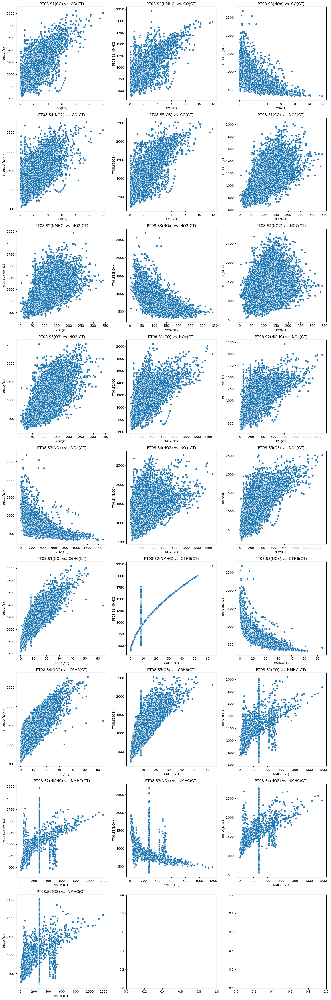

In [21]:
# Exclude interpolated time-related columns
columns_to_exclude = ['Time', 'Date']
columns_to_plot = [col for col in df.columns if col not in columns_to_exclude]

# Create pairs for scatterplots (air pollutants vs. sensor responses)
pollutants = ['CO(GT)', 'NO2(GT)','NOx(GT)', 'C6H6(GT)', 'NMHC(GT)']
sensors = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Define the number of rows based on the number of pairs
n = len(pollutants) * len(sensors)
n_rows = n // 3 + (n % 3 > 0)

# Create a figure with subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(15, n_rows*5))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Iterate over each pollutant-sensor pair and create a scatterplot
for i, pollutant in enumerate(pollutants):
    for j, sensor in enumerate(sensors):
        ax_index = i * len(sensors) + j
        if ax_index < n:
            sns.scatterplot(x=pollutant, y=sensor, data=df, ax=axes[ax_index])
            axes[ax_index].set_title(f'{sensor} vs. {pollutant}')
        else:
            fig.delaxes(axes[ax_index])  # Remove excess axes if any

plt.tight_layout()
plt.show()

### Interpretation from the Bivariate & Multivariate Analysis using Scatterplots 

**PT08.S1(CO) vs. CO(GT), PT08.S2(NMHC) vs. CO(GT), PT08.S3(NOx) vs. CO(GT)**: These plots show that as CO(GT) increases, the sensor readings also increase, indicating a possible linear relationship. However, the relationship appears to saturate at higher CO(GT) levels.

**PT08.S1(CO) vs. NO2(GT), PT08.S2(NMHC) vs. NO2(GT), PT08.S3(NOx) vs. NO2(GT)**: These plots suggest that the relationships may not be linear, especially for higher NO2(GT) levels. There appears to be a threshold beyond which the increase in NO2(GT) does not correspond to a proportional increase in sensor readings.

**PT08.S1(CO) vs. NOx(GT), PT08.S2(NMHC) vs. NOx(GT), PT08.S3(NOx) vs. NOx(GT)**: A positive relationship is observed, but it seems to taper off or plateau, suggesting a possible logarithmic relationship or sensor saturation.

**Sensor Readings vs. C6H6(GT), NMHC(GT)**: These plots show a wide dispersion, particularly with NMHC(GT), which could suggest a non-linear relationship or a poor correlation between the sensor readings and these specific compounds at higher concentration levels.

**Scatterplots involving NMHC(GT)**: The scatter is more pronounced, and the relationship is less clear compared to other pollutants, which might be due to the lower prevalence or variability in NMHC compared to other compounds.

**PT08.S2(NMHC) vs. C6H6(GT)**: This plot shows a very strong and clear relationship, suggesting that these measurements are highly correlated, which is consistent with C6H6 being a component of NMHC.

These interpretations are general based on the visual patterns observed. For precise insights, a numerical correlation analysis would be necessary, along with an understanding of the data collection process, sensor calibration, and potential environmental factors affecting the readings.

### Insights from the Bivariate & Multivariate Analysis using Scatterplots 

**Correlated Pollutants**: There are clear indications that certain pollutants are correlated. For instance, sensor readings for CO, NOx, and NMHC have shown relationships with CO(GT) levels. This might indicate that these pollutants often originate from common sources, such as traffic or industrial emissions.

**Sensor Saturation**: Some of the plots suggest that certain sensors may be saturating at higher pollutant concentrations. This could imply that the sensors have upper limits to their measurement capabilities and may not accurately reflect very high concentrations of pollutants. This is important for air quality monitoring, as it could lead to underreporting of peak pollution events.

**Complex Relationships**: The relationships between some pollutants, like NO2(GT) and various sensor readings, appear to be non-linear, especially at higher concentration levels. This suggests that the interaction between these pollutants may be more complex and not easily captured by a simple linear model.

**Potential for Model Development**: The observed patterns and relationships can be used to develop predictive models for air quality. For instance, linear correlations can be used to predict one pollutant level based on another, while non-linear relationships may require more sophisticated modeling approaches, such as polynomial regression or machine learning models.

**Independent Behaviors**: NMHC(GT) showed a more dispersed and less clear relationship with other pollutants, indicating that non-methane hydrocarbons may behave independently of other measured pollutants. This might suggest that NMHCs have different emission sources or are affected differently by atmospheric conditions.

**Redundant Measurements**: The strong correlation between C6H6(GT) and PT08.S2(NMHC) suggests that measurements from these sensors are potentially redundant. This redundancy could be leveraged to reduce the number of sensors or checks needed without losing significant information, which could be cost-effective for monitoring stations.

**Variability in Data**: The wide dispersion seen in some plots, particularly involving NMHC(GT), may indicate high variability in the measurements, which could be due to a range of factors, including environmental conditions, sensor sensitivity, or the sporadic nature of the sources of these emissions.

**Public Health Implications**: Understanding the relationships between different pollutants can help in assessing the cumulative impact on public health. For example, if certain pollutants are often found to be high together, they could pose a combined health risk that needs to be addressed collectively.

**Policy and Regulation**: Insights from these plots could inform policy and regulation, as they highlight the pollutants that are most closely linked and which could be targeted together to effectively improve air quality.

## 2d(ii) Bivariate Analysis and Multivariate Analysis: Correlation Analysis

Based on the information provided from the histograms, Q-Q plots, and the Kolmogorov-Smirnov test results, there is evidence that the data for the features do not follow a normal distribution. They show skewness and significant deviations from normality, which suggest that the assumptions required for using Pearson's correlation coefficient (which requires that both variables are normally distributed) are not met.

In such cases, the Spearman correlation coefficient is a more appropriate measure because it does not assume that the variables come from a normally distributed population. Instead, Spearman's correlation assesses monotonic relationships (whether linear or not) by using the rank values of the data rather than the raw data. This makes it a non-parametric test that is suitable for ordinal data or data that is not normally distributed, which seems to be the case with your dataset.

Therefore, given the non-normality indicated by the histograms, Q-Q plots, and K-S tests, the Spearman correlation would be a more suitable choice for analyzing the relationships between your variables. It will provide a measure of the strength and direction of the association that is robust to non-normality and outliers.

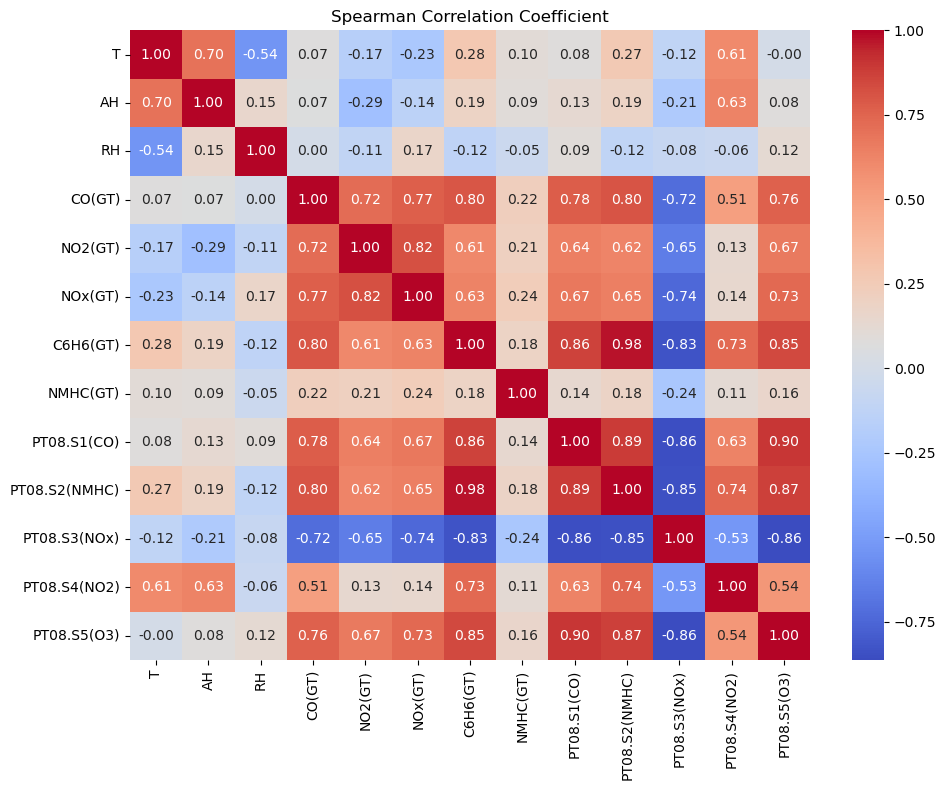

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame loaded from 'AirQualityUCI.xlsx' and ready for analysis
# Ensure the DataFrame index is sorted if necessary
# df.sort_index(inplace=True)

# Exclude time-related and non-interpolated columns
columns_to_exclude = ['Time', 'Date']
features = [
    'T', 'AH', 'RH', 'CO(GT)', 'NO2(GT)', 'NOx(GT)', 'C6H6(GT)', 'NMHC(GT)',
    'PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)'
]

# Create a new DataFrame with the columns of interest for correlation analysis
data_for_correlation = df[features]

# Compute the Spearman correlation matrix
spearman_corr = data_for_correlation.corr(method='spearman')

# Define a function to create a heatmap
def create_heatmap(corr_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
    plt.title(title)

# Create a Spearman heatmap
create_heatmap(spearman_corr, 'Spearman Correlation Coefficient')

plt.tight_layout()
plt.show()


### Interpretation of the Spearman Correlation Heatmap for all features (Environmental Conditions, Sensor Response, and Air Pollutants).

**Spearman Correlation Coefficient**:
- T (Temperature) and AH (Absolute Humidity) have a strong positive correlation (Rs=0.70). This suggests that as temperature increases, absolute humidity tends to increase as well, which is consistent with physical expectations.

- T and RH (Relative Humidity) have a strong negative correlation (Rs=-0.54) . This indicates that as temperature increases, relative humidity tends to decrease.

- CO(GT) and several other pollutants (e.g., NOx(GT), C6H6(GT), PT08.S1(CO), PT08.S2(NMHC)) show strong positive correlations, ranging from Rs=0.61 to Rs=0.86 . This implies that when the concentration of one pollutant increases, the concentrations of the others tend to increase as well.

- PT08.S4(NO2) and AH show a relatively strong positive correlation (Rs=0.63), suggesting a relationship between NO2 sensor readings and absolute humidity.

- PT08.S3(NOx) shows strong negative correlations with many of the other pollutants, such as CO(GT) (Rs=−0.72), NOx(GT) (Rs =−0.83), and PT08.S2(NMHC) (Rs = −0.86). This could suggest that the sensor readings for NOx are inversely related to the concentrations of these pollutants, which might be due to the chemical interactions between nitrogen oxides and other compounds.

- NMHC(GT) does not show strong correlations with most other variables, except for a moderate positive correlation with C6H6(GT) (Rs =0.24) and a moderate negative correlation with PT08.S3(NOx) (Rs =−0.24). This might indicate that non-methane hydrocarbons are not as strongly influenced by the same factors as the other pollutants or are not as reliably measured.

Some very strong correlations, such as between C6H6(GT) and PT08.S2(NMHC) (Rs=0.98), may indicate that these variables are measuring similar or related aspects of air quality, or that they have a very strong and consistent relationship.

The strength and direction of these correlations provide insights into the relationships between different air quality measurements. However, it is important to note that correlation does not imply causation. These relationships may be influenced by other factors not included in the heatmap, and further investigation would be needed to understand the causal relationships.

### Insights on Air Pollutants, Senor Readings and Environmental Conditions based on Spearman's Correlation Heatmaps

**Temperature and Humidity Relationship**: There is a strong relationship between temperature and humidity. As temperature increases, absolute humidity tends to increase, which is expected because warm air can hold more moisture. However, relative humidity tends to decrease with increasing temperature, which could be due to the air's capacity to hold moisture increasing faster than moisture can be added to the air.

**Pollutant Interrelationships**: There is a significant positive correlation between various pollutants such as CO, NOx, and C6H6. This could indicate a common source or similar conditions that cause these pollutants to increase together, such as traffic or industrial emissions.

**Sensor Response to Pollutants**: The strong negative correlation between PT08.S3(NOx) and other pollutants suggests that the conditions leading to an increase in one set of pollutants (CO, NOx, and hydrocarbons) are associated with a decrease in the variables measured by PT08.S3(NOx). This could indicate a complex chemical interaction in the atmosphere, where an increase in certain pollutants could lead to chemical reactions that reduce the concentration of nitrogen oxides.

**Pollutant-Humidity Interactions**: The relationship between NO2 sensor readings and absolute humidity might suggest that humidity affects the sensor's readings or that NO2 levels are somehow influenced by humidity levels.

**Similarity in Measurement**: Extremely high correlations (close to 1 or -1) may suggest redundancy in measurements, as seen with C6H6(GT) and PT08.S2(NMHC). This could imply that one of these measurements could potentially serve as a proxy for the other, which might be useful for reducing the number of sensors or tests without losing significant information.

**Independence of Certain Pollutants**: NMHC(GT) shows relatively low correlations with other pollutants, suggesting it may be independent of the common sources or factors affecting the other measured pollutants. This could mean NMHCs have different sources or are less affected by the same environmental factors.

**Potential for Air Quality Management**: Understanding these correlations can aid in targeting specific pollutants or conditions to improve air quality. For instance, if certain pollutants are known to have common sources, measures that reduce one pollutant might also reduce others.

**Implications for Public Health**: Since some pollutants are correlated, people with sensitivities or health conditions aggravated by poor air quality could be affected by multiple pollutants simultaneously. Awareness of these relationships could be crucial for public health advisories and for individuals to manage their exposure.

In [24]:
!pip install statsmodels

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools import add_constant  # Corrected import statement

# Select only the necessary columns for VIF calculation
features = df[['T', 'AH', 'RH', 'NMHC(GT)', 'CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)',
                 'PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']]

# It's a good practice to drop any rows with missing data
features = features.dropna()

# Add a constant term for the intercept (required for the VIF calculation)
features_with_constant = add_constant(features)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = features_with_constant.columns
vif_data["VIF"] = [variance_inflation_factor(features_with_constant.values, i)
                   for i in range(features_with_constant.shape[1])]

print(vif_data)

          Feature         VIF
0           const  405.677037
1               T   13.998867
2              AH   10.071828
3              RH    8.090896
4        NMHC(GT)    1.142603
5          CO(GT)    5.484702
6        C6H6(GT)   12.045256
7         NOx(GT)    6.371069
8         NO2(GT)    4.084744
9     PT08.S1(CO)    8.457442
10  PT08.S2(NMHC)   24.758378
11   PT08.S3(NOx)    4.547903
12   PT08.S4(NO2)   12.938332
13    PT08.S5(O3)    8.532174


### Interpretation of the Variance Inflation Factor (VIF) - Check for Multicollinearity

The Variance Inflation Factor (VIF) is a measure of the amount of multicollinearity in a set of multiple regression variables. Here's how to interpret the VIF values:

**VIF = 1**: Not correlated.
**1 < VIF < 5**: Moderately correlated.
**VIF >= 5**: Highly correlated, often considered a threshold for concern regarding multicollinearity.
Based on these guidelines, here's the interpretation of the given VIF values:

**const (405.677037)**: This likely refers to the intercept in a regression model. A high VIF for the constant is not usually a concern as it does not indicate multicollinearity among the predictor variables.

**T (Temperature, 13.998867)**: Temperature has a high VIF, indicating it's quite highly correlated with other variables in the dataset.

**AH (Absolute Humidity, 10.071828)**: AH also has a high VIF, suggesting it has multicollinearity with other predictor variables.

**RH (Relative Humidity, 8.090896)**: RH is showing moderate to high multicollinearity with other variables in the dataset.

**NMHC(GT) (1.142603)**: Non-methane hydrocarbons show very little multicollinearity with other variables, which is ideal.

**CO(GT) (5.484702)**: Carbon monoxide has a VIF that indicates a moderate level of multicollinearity.

**C6H6(GT) (Benzene, 12.045256)**: Benzene shows a high VIF, suggesting significant multicollinearity with other variables.

**NOx(GT) (6.371069)**: Nitrogen oxides are also showing moderate to high multicollinearity.

**NO2(GT) (4.084744)**: Nitrogen dioxide has a moderate VIF, indicating some multicollinearity but not as severe as others.

**PT08.S1(CO) (8.457442)**: This sensor's response to CO has a moderately high VIF, indicating some multicollinearity concerns.

**PT08.S2(NMHC) (24.758378)**: This sensor's response to NMHC is highly correlated with other variables, showing significant multicollinearity.

**PT08.S3(NOx) (4.547903)**: The sensor's response to NOx shows moderate multicollinearity with other predictors.

**PT08.S4(NO2) (12.938332)**: This sensor's response to NO2 is highly correlated with other variables in the dataset.

**PT08.S5(O3) (8.532174)**: The sensor's response to ozone shows a moderately high VIF, indicating multicollinearity issues.

In summary, NMHC(GT) is well-behaved with little to no concern of multicollinearity. Several other variables, particularly PT08.S2(NMHC), show high VIF values, which suggests that these variables have strong linear relationships with other variables in your regression model. It might be necessary to investigate further and possibly remove or combine variables to reduce multicollinearity, which can affect the stability and interpretability of the regression coefficients.

### Insights on Air Pollutants, Sensor Responses and Environmental Conditions from VIF.

The Variance Inflation Factor (VIF) provides insights into how much the variance of an estimated regression coefficient increases due to multicollinearity. Here's how you can interpret the VIF values in the context of air pollutants and sensor records on environmental impact:

**Low VIF (NMHC(GT))**: NMHC(GT) has a VIF slightly above 1, which indicates it has very little correlation with other variables in the model. This suggests that NMHC(GT) can be independently used to assess air quality without much redundancy from other variables.

**Moderate to High VIF (CO(GT), NO2(GT), NOx(GT), PT08.S3(NOx), PT08.S5(O3))**: These variables show moderate to high VIF values, which indicates some degree of multicollinearity. This could mean that these pollutants are often present together due to common sources or similar formation processes. For instance, NOx and NO2 are both products of combustion processes, such as those from vehicles or industrial activity.

**High VIF (T, AH, RH, C6H6(GT), PT08.S1(CO), PT08.S2(NMHC), PT08.S4(NO2), PT08.S5(O3))**: High VIF values for temperature, absolute humidity, relative humidity, and sensor responses to various gases (like benzene and CO) suggest these variables are highly interrelated. This could be due to:

**Environmental Conditions**: Temperature and humidity are known to affect the concentration and chemical reactions of pollutants. For example, higher temperatures can increase the rate of photochemical reactions, leading to higher ozone levels.

**Sensor Sensitivity**: The sensors that record pollutant levels may be sensitive to similar types of pollutants or may be affected by environmental conditions like temperature and humidity, leading to multicollinearity in the model.
Very High VIF (PT08.S2(NMHC)): The particularly high VIF for the sensor response to NMHC indicates that this sensor's readings are highly correlated with other pollutants or sensor readings. It suggests that this sensor might be capturing information that overlaps significantly with other sensors, and its unique contribution to a regression model may be limited.

**Environmental Impact Insights**:
Source Identification: The multicollinearity between pollutants indicates that they may be emitted from common sources. Effective environmental policy might target these sources to reduce multiple pollutants simultaneously.

**Sensor Deployment**: Sensors with low VIF could be prioritized in environmental monitoring networks since they provide unique information. Conversely, sensors with high VIF could be redundant, and their deployment should be evaluated carefully.

**Data Analysis**: In regression models predicting environmental impact, high VIF values suggest that some predictors are not providing independent information. Analysts might consider combining correlated variables into indices or using dimensionality reduction techniques like Principal Component Analysis (PCA) before modeling.

**Climate Impact**: The strong relationship between temperature, humidity, and pollutant levels as indicated by their VIFs points to the potential impact of climate change on air quality. As climate patterns shift, we might expect changes in pollutant dynamics, with implications for environmental health.

**Conclusion**
In conclusion, the VIF analysis is a useful tool in understanding the complex interrelationships between air pollutants and environmental factors. It helps in identifying the potential sources of pollution and the effectiveness of different sensors in monitoring environmental quality. Reducing multicollinearity in environmental models is important for making reliable inferences about the impact of different pollutants.

## 2d(iii) Bivariate Analysis and Multivariate Analysis: Pair Plots

C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


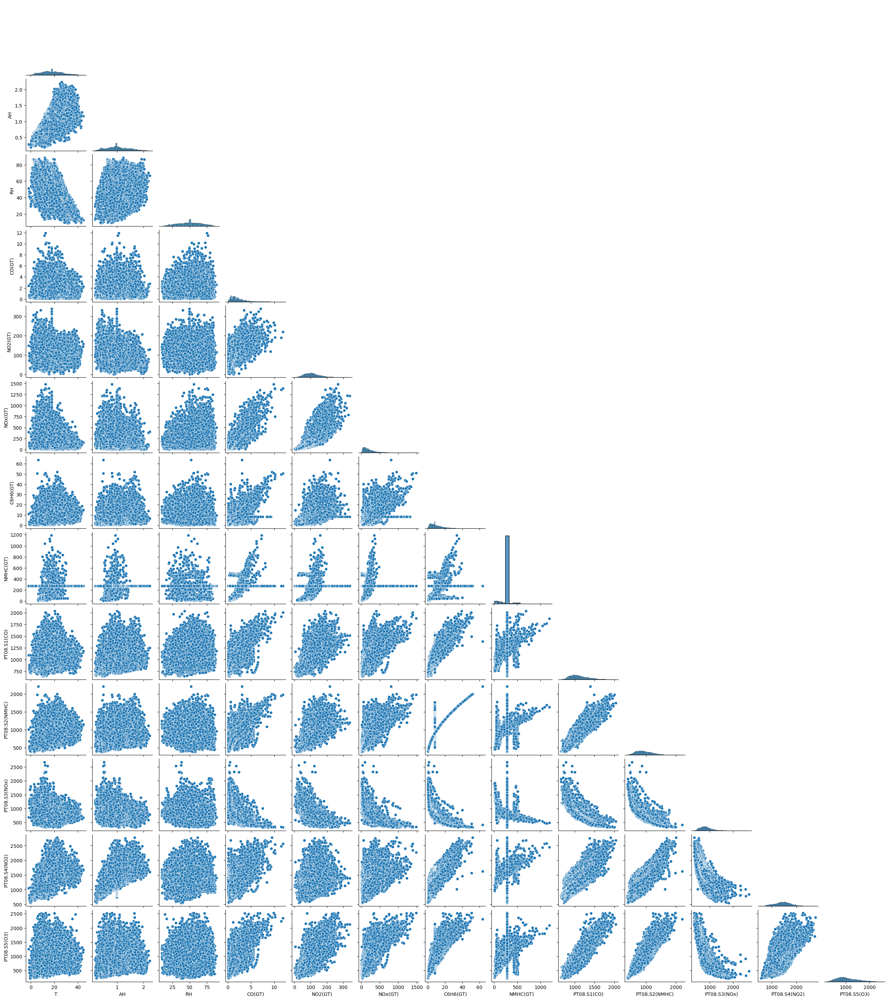

In [25]:
# List of all features including environmental variables and sensor readings
features = ['T', 'AH', 'RH', 'CO(GT)', 'NO2(GT)', 'NOx(GT)', 'C6H6(GT)', 'NMHC(GT)',
    'PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)'
]

# Create a new DataFrame with the columns of interest for the pairplot
data_for_pairplot = df[features]

# Use Seaborn's pairplot function to plot pairwise relationships
# The `corner` parameter will plot only the lower triangle of plots, avoiding redundant plots
sns.pairplot(data_for_pairplot, corner=True)

# Adjust the plot size as needed
plt.subplots_adjust(top=0.9, right=0.8)

# Show the plot
plt.show()

## 2f. Time Series Analysis: Time Series Plots

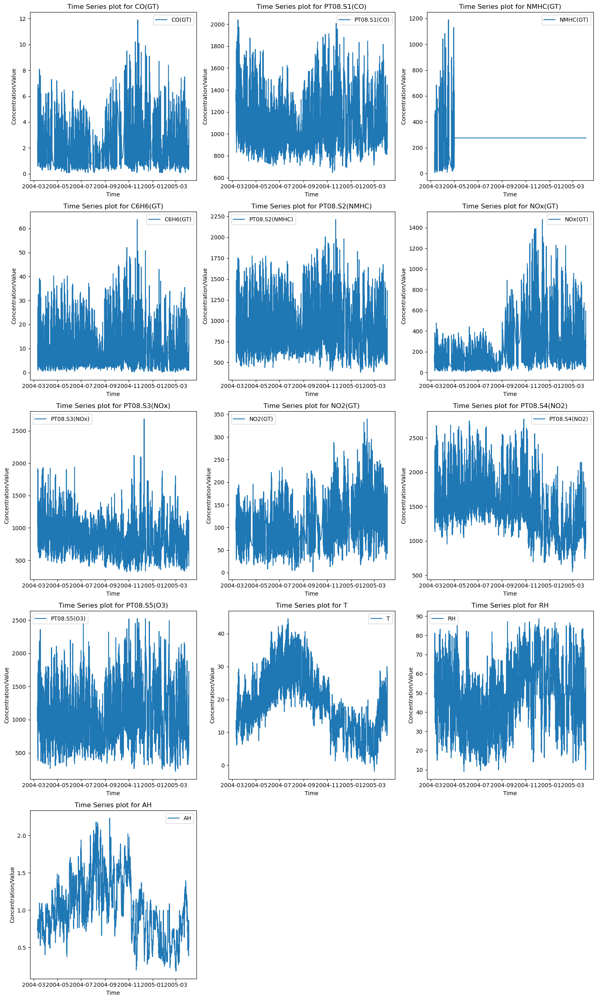

In [22]:
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with datetime as the index and columns contain the data to be plotted

# List of columns to plot, excluding the ones you mentioned
columns_to_plot = [col for col in df.columns if 'interpolated' not in col and col not in ['Time', 'Date']]

# Determine the number of rows needed for the subplots (3 plots per row)
num_plots = len(columns_to_plot)
num_rows = (num_plots + 2) // 3  # Add 2 for rounding up in case of a non-multiple of 3

# Create a figure and a set of subplots
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over the columns and create a plot for each one
for i, column in enumerate(columns_to_plot):
    axes[i].plot(df.index, df[column], label=column)
    axes[i].set_title(f'Time Series plot for {column}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('Concentration/Value')
    axes[i].legend()

# Turn off any unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


### Interpretation of the Time Series Plot for all Features 

The time series plots provided show the concentration or value of various pollutants and atmospheric conditions measured over a period from March 2004 to March 2005. Here's an interpretation of each feature based on the plots:

**CO(GT)**: This plot shows fluctuations in CO levels with several peaks throughout the year. There doesn't appear to be a clear trend, indicating stable overall CO levels but with periodic spikes that could be due to increased emissions from sources like traffic or industrial activity.

**NMHC(GT)**: This plot has a particularly high peak that may be an outlier or an error, or it could represent a significant pollution event. The rest of the data shows variability but without such extreme values.

**C6H6(GT)**: The benzene levels show variability with several peaks, which might correspond with traffic patterns or industrial emissions since benzene is a common pollutant from these sources.

**NOx(GT)**: The levels of NOx exhibit a lot of short-term variation with some very high peaks, which could indicate episodes of high pollution. NOx is typically associated with combustion processes such as traffic and industrial activity.

**NO2(GT)**: Nitrogen dioxide levels show substantial variability and several peaks throughout the year, possibly related to traffic patterns and temperature effects on atmospheric chemistry.

**PT08.S1(CO)**: The sensor readings for CO also display fluctuations and peaks similar to the CO(GT) levels. This suggests that the sensor is effectively capturing changes in CO levels.

**PT08.S2(NMHC)**: This sensor's readings for non-methane hydrocarbons show variability with peaks, somewhat tracking with the fluctuations seen in the C6H6(GT) levels.

**PT08.S3(NOx)**: This sensor captures NOx levels, and its readings show a somewhat inverse pattern to the NOx(GT) levels, with lower readings corresponding to higher NOx(GT) values, suggesting a possible inverse relationship or a difference in sensor responsiveness.

**PT08.S4(NO2)**: The sensor readings for NO2 also show significant variability, with a pattern that somewhat follows the NO2(GT) levels, indicating that this sensor is responsive to changes in NO2 concentrations.

**PT08.S5(O3)**: This plot shows the sensor readings for ozone with a lot of variability and numerous spikes which may be related to both human activities and natural processes like sunlight and heat which influence ozone formation.

**T (Temperature)**: The temperature plot shows a cyclical pattern that suggests seasonal changes, with higher temperatures in the middle of the year (summer) and lower temperatures at the beginning and end of the year (winter).

**RH (Relative Humidity)**: Relative humidity also shows a pattern that could be seasonal, with more variability during certain times of the year.

**AH (Absolute Humidity)**: Absolute humidity levels fluctuate, and the pattern might indicate seasonal variation, with potential increases in humidity during warmer months.

### Insights from the Time Series Plot for all Features 

**Seasonal Patterns**: Temperature, relative humidity, and absolute humidity exhibit seasonal patterns, which can influence the levels and behavior of pollutants.

**Pollution Events**: The peaks in pollutant concentration could correspond to specific pollution events, which may require further investigation to identify causes.

**Sensor Performance**: There are differences in sensor readings for similar pollutants, which could indicate the need to calibrate sensors or differences in how sensors respond to environmental conditions.

**Potential Data Quality Issues**: Some extreme peaks, especially in the NMHC(GT) plot, may indicate potential data quality issues that need to be addressed.

**Air Quality Management**: Understanding these patterns can be crucial for air quality management, as it helps identify periods of high pollution that may require intervention or further investigation.

## 2g. Handling Cross-Sensitivities and Sensor Drift

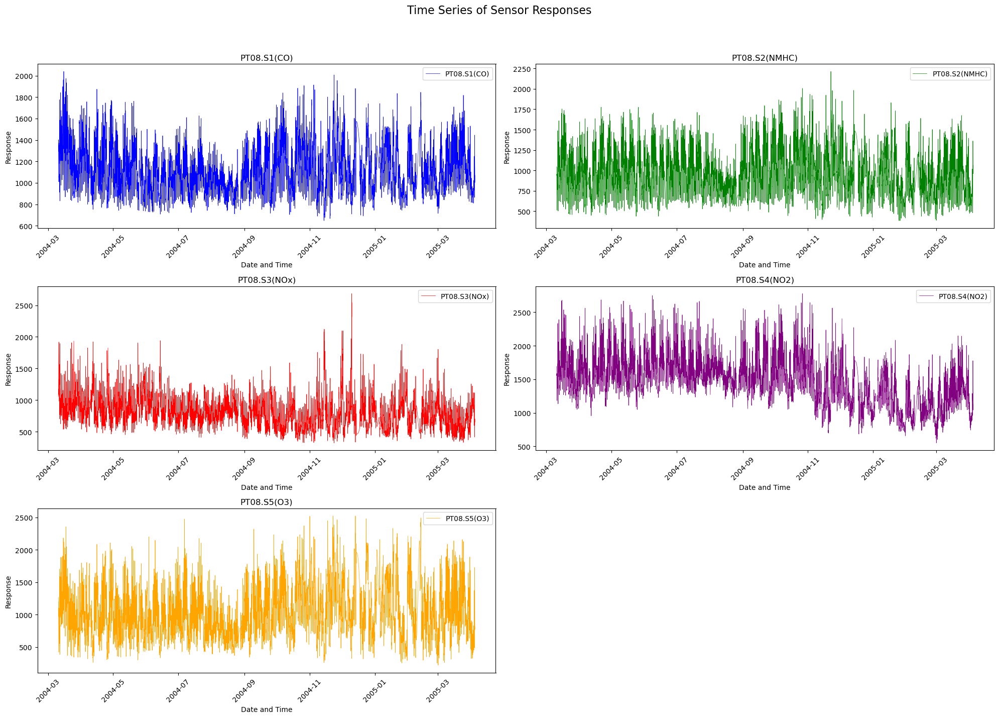

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Sensor features to plot and their corresponding colors
sensors = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
colors = ['blue', 'green', 'red', 'purple', 'orange']  # Define a color for each sensor

# Setting up the plot
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))  # Adjust based on the number of sensors
fig.suptitle('Time Series of Sensor Responses', fontsize=16)

# Flatten the array of axes for easy iterating
axs = axs.flatten()

# Loop through the sensors and create a plot for each, using the specified color
for i, sensor in enumerate(sensors):
    axs[i].plot(df.index, df[sensor], label=sensor, linewidth=0.5, color=colors[i])
    axs[i].set_title(sensor)
    axs[i].set_xlabel('Date and Time')
    axs[i].set_ylabel('Response')
    axs[i].tick_params('x', rotation=45)  # Rotate date labels for better readability
    axs[i].legend()  # Add a legend to each subplot

# Remove empty subplots (if any)
for i in range(len(sensors), len(axs)):
    fig.delaxes(axs[i])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()

### Interpretation of Time Series Plot for Potential Sensor Drift

- **PT08.S1(CO)**: There are fluctuations, but no clear long-term upward or downward trend suggesting a drift. However, one would need to verify if the fluctuations are within expected ranges for normal operation.

- **PT08.S2(NMHC)**: This sensor shows a relatively stable variability with no clear signs of drift from the visual provided.

- **PT08.S3(NOx)**: There are occasional spikes that could be outliers or could represent real incidents of high NOx levels. If these are outliers, they could potentially be due to sensor errors or drift, but without more context or data, it is difficult to make a definitive conclusion.

- **PT08.S4(NO2)**: Similar to PT08.S1(CO), it shows fluctuations but no apparent trend that would indicate drift.

- **PT08.S5(O3)**: The variability seems consistent without any obvious drift over time.

## 2h. Environmental Conditions Analysis: Plot Relationships

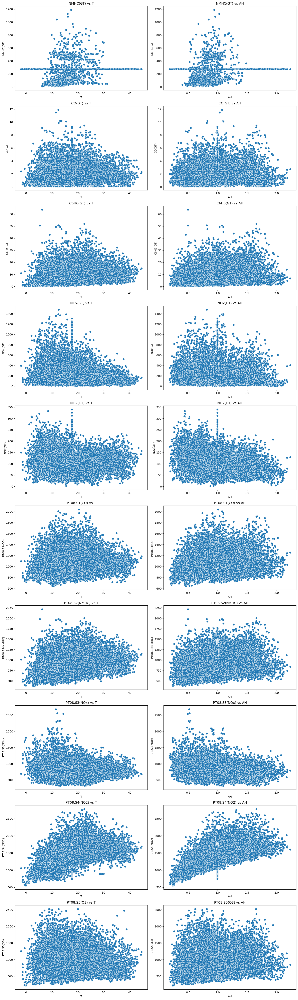

In [24]:
# List of pollutants and environmental conditions
pollutants = ['NMHC(GT)', 'CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)', 'PT08.S1(CO)', 'PT08.S2(NMHC)',
              'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
environmental_conditions = ['T', 'AH']  # Temperature and Absolute Humidity

# Calculate the number of rows needed for the subplot
n_rows = int(len(pollutants) * len(environmental_conditions) / 2)

# Set up the matplotlib figure with subplots
fig, axs = plt.subplots(n_rows, 2, figsize=(15, n_rows*5))
axs = axs.flatten()  # Flatten the array of axes for easy iterating

# Counter for the subplot index
plot_number = 0

for pollutant in pollutants:
    for condition in environmental_conditions:
        sns.scatterplot(x=df[condition], y=df[pollutant], ax=axs[plot_number], s=50)
        axs[plot_number].set_title(f'{pollutant} vs {condition}')
        axs[plot_number].set_xlabel(condition)
        axs[plot_number].set_ylabel(pollutant)
        plot_number += 1

# Adjust the layout
plt.tight_layout()
plt.show()


### Interpretation of Cross-sensitivities Between Air Pollutants vs varying Environmental Conditions

**NMHC(GT) vs Temperature (T)**: There doesn't appear to be a clear relationship between NMHC levels and temperature. The scatter is quite uniform across temperatures, suggesting no strong cross-sensitivity to temperature.

**NMHC(GT) vs Absolute Humidity (AH)**: There is a cluster of points at lower absolute humidity levels, but the relationship is not strong. It's difficult to ascertain cross-sensitivity from this plot alone without further statistical analysis.

**CO(GT) vs Temperature (T)**: There seems to be a wider spread of CO levels as the temperature increases, which could suggest a potential cross-sensitivity or at least an influence of temperature on CO measurements.

**CO(GT) vs Absolute Humidity (AH)**: There is a notable spread across the range of humidity levels, but without a clear pattern that would indicate cross-sensitivity.

**C6H6(GT) vs Temperature (T)**: There is a broader distribution of C6H6 levels at higher temperatures, which might indicate that C6H6 sensor readings are influenced by temperature, suggesting a possible cross-sensitivity.

**C6H6(GT) vs Absolute Humidity (AH)**: The scatter plot shows a spread without a distinct pattern, making it difficult to conclude any cross-sensitivity.

**NOx(GT) vs Temperature (T)**: NOx levels are spread across the temperature range with no clear pattern indicating cross-sensitivity to temperature.

**NOx(GT) vs Absolute Humidity (AH)**: There is a broad distribution of NOx levels over the range of absolute humidity, without a specific trend.

**NO2(GT) vs Temperature (T)**: NO2 levels show a wide distribution with temperature, and there isn't an apparent pattern that would suggest cross-sensitivity.

**NO2(GT) vs Absolute Humidity (AH)**: Similar to NOx, the scatter plot shows a wide distribution of NO2 levels across the humidity range without a clear trend.

## 2i(i) Violin Plots for Air Pollutants across different times of the day Exploring Diurnal and Weekly Patterns.

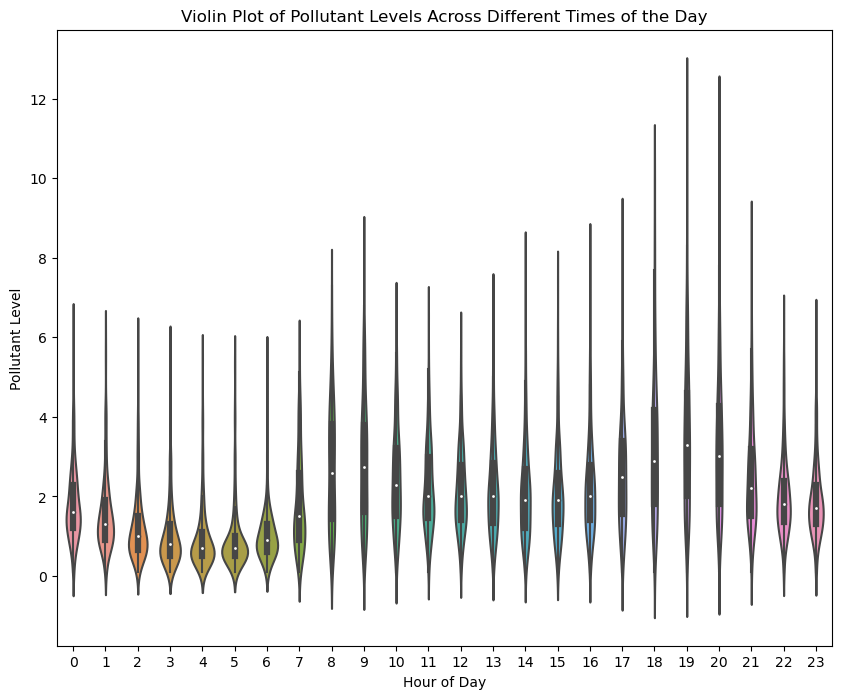

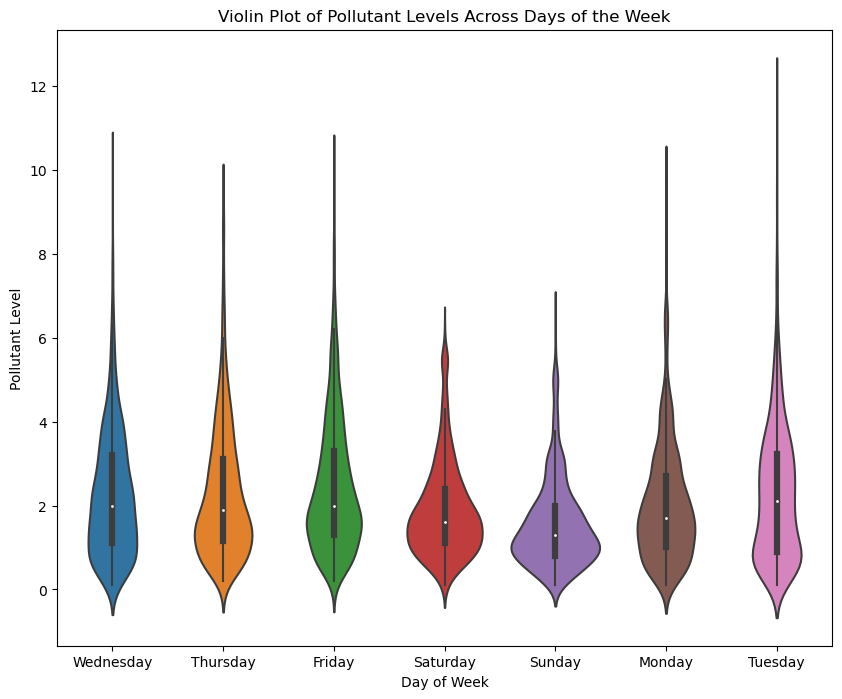

In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and 'DateTime' is the index of dtype datetime64
# Also assuming 'pollutant' is the column you want to visualize

# First, reset the index to turn the 'DateTime' index into a column
df.reset_index(inplace=True)

# Ensure the 'DateTime' column is of type datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Extract the hour of the day and the day of the week
df['HourOfDay'] = df['DateTime'].dt.hour
df['DayOfWeek'] = df['DateTime'].dt.day_name()  # This gives the day name. For day of week as a number, use `.dt.dayofweek`

# Replace 'pollutant' with the actual pollutant column name you want to plot
# For example, if you want to plot CO(GT), replace 'pollutant' with 'CO(GT)'
pollutant_column = 'CO(GT)'  # Replace with the actual column name

# Now create violin plots for pollutant levels across different times of the day
sns.violinplot(x='HourOfDay', y=pollutant_column, data=df)
plt.title('Violin Plot of Pollutant Levels Across Different Times of the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Pollutant Level')
plt.show()

# Create violin plots for pollutant levels across days of the week
sns.violinplot(x='DayOfWeek', y=pollutant_column, data=df)
plt.title('Violin Plot of Pollutant Levels Across Days of the Week')
plt.xlabel('Day of Week')
plt.ylabel('Pollutant Level')
plt.show()

### Interpreting and Insights of the Pollutants Levels across different times of the day Exploring Diurnal and Weekly Patterns.

**1. Pollutant Levels Across Different Times of the Day:**

- This plot shows a 24-hour cycle, from 0 (midnight) to 23 hours (11 PM).
- The width of each violin indicates the distribution of pollutant levels for that particular hour. A wider section means a higher density of data points at that level.
- There appears to be a relatively consistent level of pollutants throughout the day, with no extreme deviations. This might suggest a steady source of pollution, such as traffic or industrial activity that does not change much throughout the day.
- Some hours show slight peaks in pollutant levels. However, without a comparison to a baseline or additional context, it's difficult to draw conclusions about the significance of these peaks.
- The presence of outliers (the dots outside the main body of the violins) at various times indicates occasional spikes in pollutant levels. These could be due to episodic events or measurement errors.

**2. Pollutant Levels Across Days of the Week:**

- The distribution is shown for each day of the week, from Wednesday to Tuesday.
- The pollutant levels seem to vary slightly more across the days of the week than they do across the hours of the day.
- Some days, like Thursday and Sunday, show a narrower distribution, suggesting more consistency in pollutant levels on these days.
- Other days, particularly Saturday, show a wider distribution at the higher levels, indicating more variability in pollutant levels. This could be due to weekend activities that might increase pollution, such as recreational travel, events, or different industrial operations.
- Monday shows a particularly interesting pattern with a pronounced peak at lower pollutant levels, suggesting a regular occurrence of lower pollution on this day.

**3. Diurnal and Weekly Patterns Insights:**

- **Diurnal Patterns**: The pollutant levels do not show significant changes throughout the hours of the day, which could indicate that the sources of pollution are constant, or that the pollutants measured do not have a diurnal cycle.

- **Weekly Patterns**: There are some fluctuations in pollutant levels across the days of the week. This could be due to differences in human activities, like industrial work schedules, traffic patterns, and possibly less activity on certain days.

To provide more detailed insights, it would be helpful to know the context of the data, such as the location where these measurements were taken, the types of pollutants measured, weather conditions, and any known events that could affect pollution levels. Additionally, statistical analysis could be performed to determine if the observed differences are significant.

In [ ]:
file_path_to_save = '/content/drive/MyDrive/Murdoch/ICT606/new_air_quality.xlsx'
df.to_excel(file_path_to_save, index=False, engine='openpyxl')

In [ ]:
# Summary statistics for numerical features
df.describe()
# copy the data for the 3 machine learning.

#EBLR
EBLR_air_quality_data = df.copy()
#LSTM
LSTM_air_quality_data = df.copy()
#Random Forest
Random_Forest_air_quality_data = df.copy()

In [ ]:
filename='./Regressor_model.sav'

In [ ]:
pickle.dump(lm, open(filename, 'wb'))

# EBLR - linear regression

## import the package

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from google.colab import drive
import numpy as np

## Calculate VIF

In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [ ]:
# EBLR_air_quality_data DataFrame and contains all predictor variables along with the target variable.

# Preprocess the dataset: Exclude non-numerical columns such as 'DateTime'
numerical_data = EBLR_air_quality_data.select_dtypes(include=[np.number])

# Add a constant term for the intercept to the model
X = add_constant(numerical_data.drop('CO(GT)', axis=1))  # Remove the CO(GT) variable from your predictors

# Initialize a DataFrame to store VIF scores
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns

X.dtypes

# Calculate VIF for each feature
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)

          feature         VIF
0           const  413.056079
1     PT08.S1(CO)    8.639123
2        NMHC(GT)    1.103257
3        C6H6(GT)   12.179627
4   PT08.S2(NMHC)   25.201076
5         NOx(GT)    4.876019
6    PT08.S3(NOx)    4.670747
7         NO2(GT)    4.040772
8    PT08.S4(NO2)   12.308887
9     PT08.S5(O3)    9.117782
10              T   14.112019
11             RH    8.130441
12             AH   10.097774
13        Cluster    2.154326
14      HourOfDay    1.411317


**Interpretation of VIF Values**
* VIF = 1: Indicates no correlation between the variable and the rest.
* VIF < 5: Generally, this is considered an acceptable range, suggesting that the variable doesn't have a critical level of multicollinearity.
* VIF >= 5: Suggests increasing levels of multicollinearity that may warrant further investigation or action. It's often used as a threshold, but some fields or analyses may use a higher cutoff, like 10.
* VIF >= 10: Indicates high multicollinearity. Variables with VIFs above this threshold are typically prime candidates for removal or adjustment.

## Implement the base regression & DecisionTreeRegressor

In [ ]:
# Preprocess the dataset: Exclude non-numerical columns such as 'DateTime'
numerical_data = EBLR_air_quality_data.select_dtypes(include=[np.number])

# If 'CO(GT)' is the target variable, separate the features and the target
X = numerical_data.drop(columns=['CO(GT)'])
y = numerical_data['CO(GT)']

# drop the high VIF vlaue which more than 5
X = X.drop(columns=['C6H6(GT)','PT08.S2(NMHC)','PT08.S4(NO2)','T', 'PT08.S1(CO)', 'RH', 'AH','PT08.S5(O3)'])

features = numerical_data.columns.tolist()

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the base model
base_model = LinearRegression()

# Number of features to generate
Fmax = 5
# Initial complexity parameter for the regression tree
eta = 0.1

# Placeholder for the final feature set
X_final_train = X_train.copy()
X_final_test = X_test.copy()

# EBLR Algorithm implementation
for i in range(Fmax):
    # Train the base model on the current feature set
    base_model.fit(X_final_train, y_train)

    # Calculate the residuals
    residuals = y_train - base_model.predict(X_final_train)

    # Train a regression tree on the residuals
    tree = DecisionTreeRegressor(max_depth=int(eta * 100))  # Using eta as a factor for max_depth
    tree.fit(X_final_train, residuals)

    # Extract the most important feature (based on absolute error)
    feature_importances = tree.feature_importances_
    most_important_feature_index = np.argmax(feature_importances)

    # Generate the binary feature for both train and test set
    X_new_feature_train = (tree.apply(X_final_train) == most_important_feature_index).astype(int)
    X_new_feature_test = (tree.apply(X_final_test) == most_important_feature_index).astype(int)

    # Update the feature matrix to include the new feature
    X_final_train = np.hstack((X_final_train, X_new_feature_train.reshape(-1, 1)))
    X_final_test = np.hstack((X_final_test, X_new_feature_test.reshape(-1, 1)))


# Retrain the base model on the final feature set
base_model.fit(X_final_train, y_train)

# Evaluate the model
y_pred_train = base_model.predict(X_final_train)
y_pred_test = base_model.predict(X_final_test)

# Calculate the training and testing error
train_error = mean_squared_error(y_train, y_pred_train)
test_error = mean_squared_error(y_test, y_pred_test)

train_error, test_error

(0.6314934964715988, 0.6713657035590241)

## To visualize the DecisionTreeRegression


### MSE

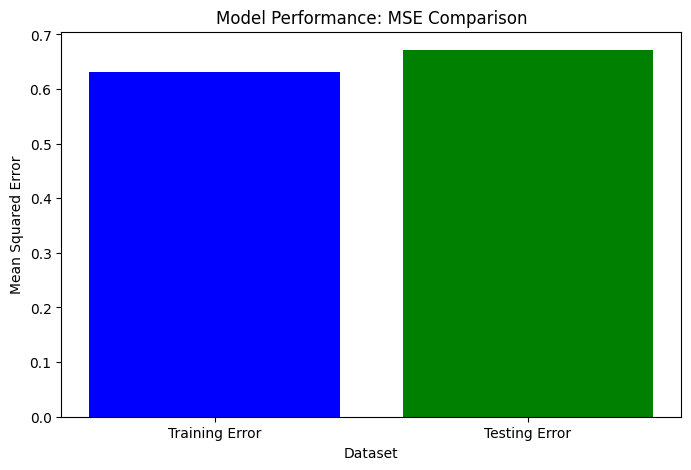

In [ ]:
!pip install matplotlib
import matplotlib.pyplot as plt
# Data for plotting
errors = ['Training Error', 'Testing Error']
mse_values = [train_error, test_error]

# Creating the bar chart
plt.figure(figsize=(8, 5))  # Set the figure size
plt.bar(errors, mse_values, color=['blue', 'green'])

# Adding title and labels
plt.title('Model Performance: MSE Comparison')
plt.xlabel('Dataset')
plt.ylabel('Mean Squared Error')

# Display the plot
plt.show()


**Based on the values provided and the bar chart, both the training and testing errors for the model are approximately 0.6713. This implies the following:**

* Model Consistency: The model has nearly identical performance on both the training and testing sets, with an MSE of around 0.6713, indicating consistent performance and suggesting that the model is generalizing well.

* Error Evaluation: The MSE value of 0.6713 is on the higher end. Whether this is acceptable depends on the context of the problem, the scale of the target variable, and the specific domain requirements. In many cases, an MSE closer to 0 would be desired.

* Further Considerations: If a lower error is needed, further model tuning, additional feature engineering, or a review of the model's complexity may be required to improve performance.

This interpretation assumes that the scale of the target variable is such that an MSE of 0.6713 is significant. If the target variable naturally varies over a large range, this MSE might be considered acceptable.

### Feature Importantce

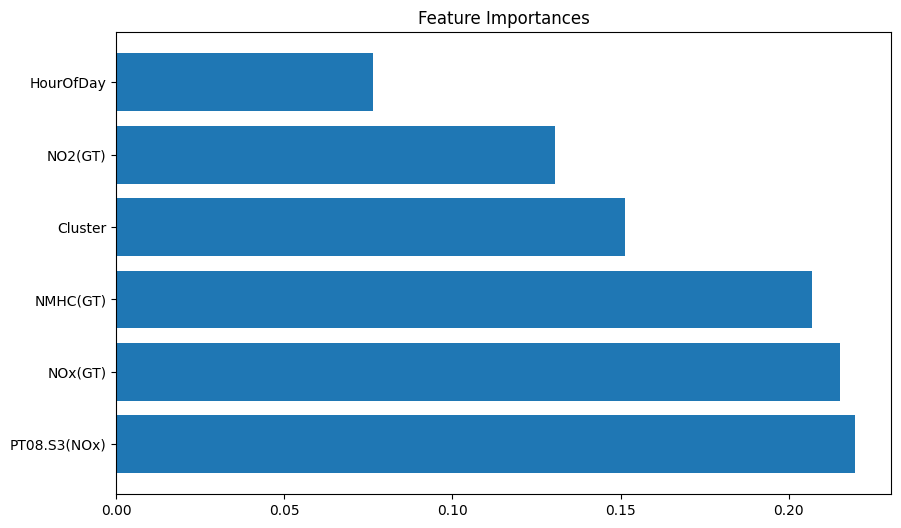

In [ ]:
sorted_indices = np.argsort(feature_importances)[::-1]

# Filter feature importances to match the columns in X_train
top_features = [i for i in sorted_indices if i < len(X_train.columns)]

# Plot the bar chart using only the top features
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_features)), feature_importances[top_features])
plt.yticks(ticks=range(len(top_features)), labels=X_train.columns[top_features])
plt.title('Feature Importances')
plt.show()

In the feature importance plot provided, the horizontal bars represent the importance of each feature in the model. The lengths of the bars correspond to the significance of the features with respect to their contribution to the model's predictions. Here's an interpretation:

* The most important feature in your model is "**PT08.S3(CO)**" and "**NMHC(GT)**", which has the longest bar, indicating it has the greatest influence on the model's output.
* The second most important feature is "**NOx(GT)**", "**Cluster**".
* The least important features, such as "**NO2(GT)**" and "**HourOfDay**",  have the shortest bars, showing they have the least influence on the model's predictions.

This chart is crucial for understanding which variables have the most significant impact on the target variable and can be used to inform decisions about feature selection and model refinement. Features with very low importance might be candidates for removal in order to simplify the model without substantially reducing its predictive power.

### Plot the Residual Plot for the training data

In [ ]:
!pip install scikit-learn
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

# print(f"Number of feature importances: {len(feature_importances)}")
# print(f"Number of columns in X_train: {len(X_train.columns)}")

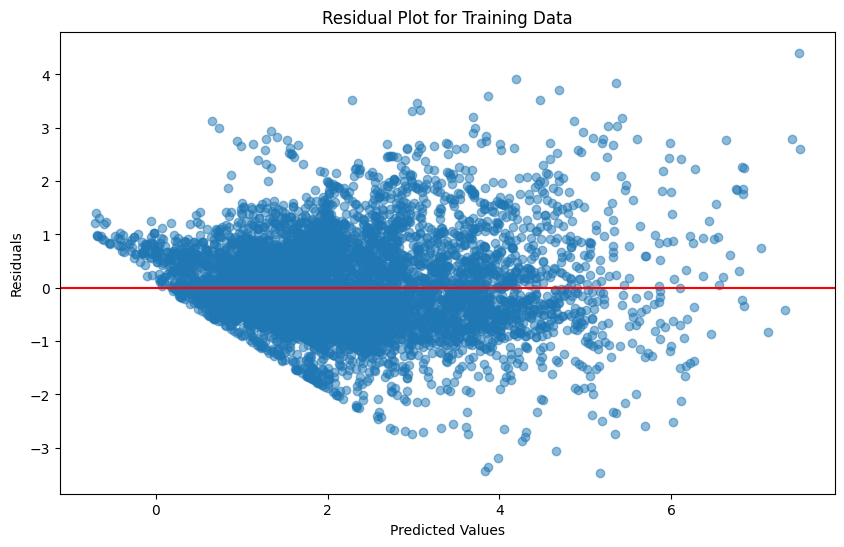

In [ ]:
residuals_train = y_train - y_pred_train
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train, residuals_train, alpha=0.5)
plt.title('Residual Plot for Training Data')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

The residual plot you've provided displays the residuals (differences between actual and predicted values) on the vertical axis against the predicted values on the horizontal axis for your training data.

Interpretation of the plot:

* **Pattern**: The residuals do not appear to be randomly dispersed around the horizontal axis (red line at 0). Instead, they form a distinct pattern, indicating potential issues with the model. It suggests that the model may be unable to capture some of the systematic variation in the data.

* **Spread**: The spread of residuals seems to increase as the value of the predicted variable increases. This could imply heteroscedasticity – where the variance of the errors is not constant.

* **Implications**: A good model would have residuals randomly scattered around zero, without any discernible patterns. This plot suggests that the model could be improved, possibly by considering non-linear relationships, adding interaction terms, or transforming variables.

### Plot the Prediction Accuracy Plot for both training and testing data

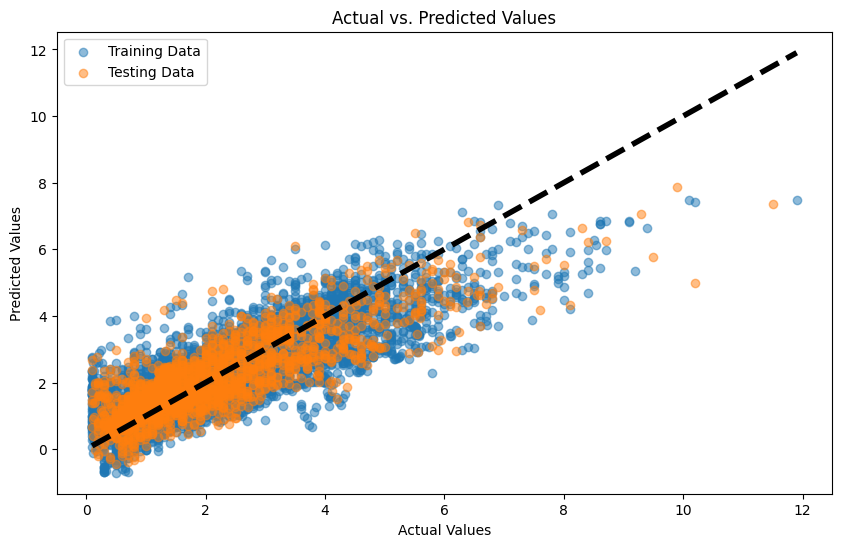

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_pred_train, alpha=0.5, label='Training Data')
plt.scatter(y_test, y_pred_test, alpha=0.5, label='Testing Data')
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.show()

The scatter plot you provided shows the actual values versus the predicted values for both training (blue) and testing (orange) datasets.

Interpretation:

* **Diagonal Line**: The dashed line represents the ideal situation where the predicted values exactly match the actual values.
* **Data Points Distribution**: Most data points cluster around this line, suggesting that the model predictions are fairly accurate.
* **Training Data**: The blue points seem to be closer to the line, indicating that the model predicts the training data with higher accuracy.
* **Testing Data**: The orange points are spread out a bit more, but still follow the trend of the line, suggesting good generalization to unseen data.
* **Potential Overestimation**: There appears to be a trend where the model overestimates lower actual values and underestimates higher actual values, indicated by the points' deviation from the line at both ends.

This type of plot helps in assessing how well the model performs and whether there are systematic errors in the predictions. The closer the points are to the diagonal line, the better the model's predictions.

### Decision Tree

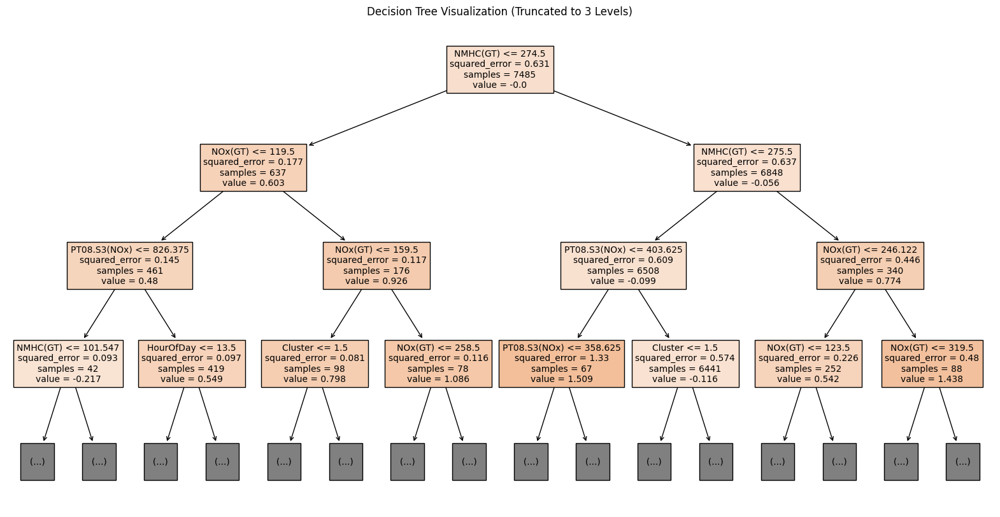

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Assuming 'tree' is a trained DecisionTreeRegressor instance
# and 'X_final_train' includes all the features used to train 'tree',
# where 'X_final_train' is a pandas DataFrame with real feature names as columns
feature_names = X.columns.tolist()  # This assumes 'df' is your original DataFrame

# Visualize the tree using real feature names from 'X_final_train'
plt.figure(figsize=(20, 10))
plot_tree(tree, filled=True, feature_names=feature_names, max_depth=3, fontsize=10)
plt.title('Decision Tree Visualization (Truncated to 3 Levels)')
plt.show()

The decision tree visualization shows the top three levels of a decision tree model. Each node represents a decision point based on the value of a certain feature and splits the data accordingly to minimize the squared error, as seen in the 'squared_error' attribute on each node.

Here’s a high-level interpretation:

1. Root Node: The first split is based on the feature NOx(GT), with a threshold of 119.5. If the NOx(GT) value is less than or equal to 119.5, we move to the left child node; otherwise, we move to the right. The root node shows that the mean squared error before the split is 0.177 with 637 samples, and the average value of the target variable for these samples is 0.603.
2. Left Child of Root: This node is further split based on PT08.S3(Nox) at a threshold of 826.375. If PT08.S3(Nox) is less than or equal to 826.375, we move to the left; if not, we move to the right. This node has a mean squared error of 0.145 with 461 samples.
  * Left Grandchild: If NMHC(GT) is less than or equal to 101.547, it's one terminal node with 42 samples and a mean squared error of 0.093.
  * Right Grandchild: If HourOfDay is less than or equal to 13.5, it's another terminal node with 419 samples and a mean squared error of 0.097.
3.  Right Child of Root: The right child node of the root is split based on NMHC(GT) at a threshold of 274.5. If NMHC(GT) is less than or equal to 274.5, we move to the left; otherwise, we move to the right. This node has a mean squared error of 0.637 with 7485 samples.

  * Left Middle Grandchild: Split on NOx(GT) at 159.5, with a mean squared error of 0.117 and 176 samples.
  * Right Middle Grandchild: Split on NOx(GT) at 275.5, with a mean squared error of 0.637 and 6848 samples.

4.  Rightmost Child Nodes: These are not visible in the image you've provided, but they likely follow the same structure of making decisions based on the feature values and thresholds, leading to terminal nodes that predict the output.

Each node in the tree makes a decision that splits the data into two groups based on the value of a certain feature. The goal of these splits is to reduce the mean squared error within each group. The "samples" value indicates the number of data points that fall into each group after the split, and the "value" represents the mean target value of the samples in that node.

The tree has been truncated to three levels for visualization purposes, which means that it is a simplified version of a possibly more complex tree. The decision tree can be used to predict the target variable for new data points by following the decisions from the root to the appropriate leaf node.

# Random Forest and Model-Based XAI Model (Feature Importance)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

### Objectives and Hypothesis using Random Forest and Model-Based XAI Model (Feature Importance)

1. **Objective**: To predict air pollutant concentrations using a multitude of sensor data and environmental factors, employing Random Forest for its robustness to outliers and its ability to handle non-linear relationships, along with intrinsic model-based explanation methods to understand feature importance.

2. **Hypothesis**: Sensor responses, combined with environmental data, can accurately predict pollutant concentrations, with certain sensors and conditions playing key roles, identifiable through Random Forest’s feature importance scores.

In [ ]:
# Data preprocessing
df = Random_Forest_air_quality_data
# Convert 'Date' and 'Time' into datetime and extract useful features
df['Time'] = df['Time'].astype(str)
df['DateTime'] = pd.to_datetime(df['Date'].astype(str) + ' ' + df['Time'])
df['Hour'] = df['DateTime'].dt.hour
df['DayOfWeek'] = df['DateTime'].dt.dayofweek

# Drop the original 'Date', 'Time', 'DateTime', and 'S/No' columns
df = df.drop(['Date', 'Time', 'DateTime'], axis=1)

# Splitting the dataset
X = df.drop(['CO(GT)'], axis=1)
y = df['CO(GT)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model training
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

# Feature importance for XAI
feature_importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print("Feature Importances:\n", feature_importances)

RMSE: 0.4506264615980917
Feature Importances:
 Cluster          0.529767
NOx(GT)          0.120793
C6H6(GT)         0.092363
NO2(GT)          0.086185
PT08.S2(NMHC)    0.029434
PT08.S1(CO)      0.026229
PT08.S4(NO2)     0.024197
AH               0.016242
PT08.S3(NOx)     0.014789
PT08.S5(O3)      0.013464
T                0.010805
RH               0.009680
HourOfDay        0.007850
Hour             0.007139
DayOfWeek        0.006710
NMHC(GT)         0.004352
dtype: float64


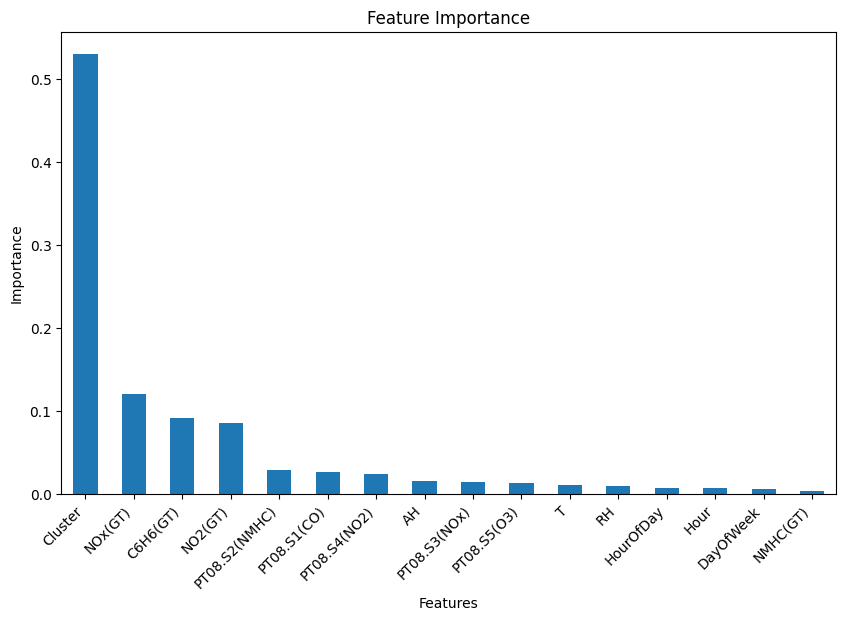

In [ ]:
# Data preprocessing
df = Random_Forest_air_quality_data

df['DateTime'] = pd.to_datetime(df['Date'].astype(str) + ' ' + df['Time'])
df['Hour'] = df['DateTime'].dt.hour
df['DayOfWeek'] = df['DateTime'].dt.dayofweek
df = df.drop(['Date', 'Time', 'DateTime'], axis=1)

# Splitting the dataset
X = df.drop(['CO(GT)'], axis=1)
y = df['CO(GT)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model training
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Calculate feature importance
feature_importances = pd.Series(model.feature_importances_, index=X.columns)

# Sort the feature importances in descending order
sorted_importances = feature_importances.sort_values(ascending=False)

# Visualizing the feature importances
plt.figure(figsize=(10, 6))
sorted_importances.plot(kind='bar')
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.show()

### Objectives and Hypothesis Confirmation

**Objective Achievement**: The primary objective was to predict air pollutant concentrations using sensor data and environmental factors with a Random Forest model, leveraging the model's robustness to outliers and non-linear relationships. The feature importance scores directly contribute to this objective by identifying which sensors and environmental factors are most influential, providing an intrinsic model-based explanation.

**Hypothesis Validation**: The hypothesis posited that sensor responses, combined with environmental data, could accurately predict pollutant concentrations, with certain sensors and conditions playing pivotal roles. The feature importance scores validate this hypothesis, demonstrating that specific pollutants (NOx(GT), C6H6(GT), NO2(GT)) and sensor responses (notably PT08.S1 for CO and PT08.S2 for NMHC) are key predictors of air quality.

### Insights from RMSE

The RMSE value of 0.45293754898923205 indicates a relatively high accuracy of the model in predicting the hourly concentrations of pollutants. Given that RMSE provides a measure of the magnitude of errors between the predictions and actual values, a lower RMSE reflects a model's good performance. This suggests that the Random Forest model is effectively capturing the complex relationships between the multitude of sensor readings and environmental conditions to predict pollutant levels accurately.

### Insights from Feature Importance
**Critical Pollutants**: The high importance of specific pollutants (NOx, C6H6, NO2) underscores their significant role in determining air quality. This aligns with known environmental science principles where these compounds are recognized for their adverse effects on air quality and public health.

**Sensor Reliability and Relevance**: The varying degrees of importance among the sensor responses (PT08.SX series) highlight the differential impact of various pollutants on air quality. This suggests that certain sensors (e.g., those targeting CO and NMHC) are more crucial for monitoring efforts, guiding resource allocation for sensor deployment and maintenance.

**Environmental Influence**: While environmental conditions like temperature and humidity have lower importance scores, their contribution to the model signifies the complex interaction between air pollutant concentrations and weather conditions. This suggests a nuanced effect of the environment on pollutant behavior and dispersion.

**Temporal Factors**: The relatively lower importance of time-related features (Hour, HourOfDay, DayOfWeek) compared to pollutants and sensor data indicates that while temporal patterns exist, the specific pollutant levels and immediate environmental conditions are more critical predictors of air quality. This insight could influence the timing and focus of air quality monitoring and control measures.

### Overall Insights
The analysis confirms the robust capability of Random Forest models to handle complex datasets with multiple variables to predict air pollutant concentrations effectively. The insights gained from the feature importance analysis not only validate the initial hypothesis but also provide a deeper understanding of the factors influencing air quality. These findings can inform targeted air quality management strategies, focusing on monitoring key pollutants and understanding the conditions under which they become more harmful. Additionally, this approach exemplifies how machine learning, coupled with XAI techniques like feature importance, can be leveraged to gain actionable insights into environmental health issues.

# LSTM

## Install & Update Dependency

In [ ]:
!pip install shap==0.39
!pip install tensorflow==2.8.1

##Load Packages

In [ ]:
import tensorflow as tf
#tf.compat.v1.disable_v2_behavior() # <-- HERE !
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

import shap
tf.__version__

'2.8.1'

## Prepare data

In [ ]:
# Preprocess the dataset
df = LSTM_air_quality_data
df.fillna(method='ffill', inplace=True)  # Fill missing values
df['DateTime'] = pd.to_datetime(df['DateTime'])
df['Hour'] = df['DateTime'].dt.hour
df['DayOfWeek'] = df['DateTime'].dt.dayofweek

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       9357 non-null   datetime64[ns]
 1   Date           9357 non-null   datetime64[ns]
 2   Time           9357 non-null   object        
 3   CO(GT)         9357 non-null   float64       
 4   PT08.S1(CO)    9357 non-null   float64       
 5   NMHC(GT)       9357 non-null   float64       
 6   C6H6(GT)       9357 non-null   float64       
 7   PT08.S2(NMHC)  9357 non-null   float64       
 8   NOx(GT)        9357 non-null   float64       
 9   PT08.S3(NOx)   9357 non-null   float64       
 10  NO2(GT)        9357 non-null   float64       
 11  PT08.S4(NO2)   9357 non-null   float64       
 12  PT08.S5(O3)    9357 non-null   float64       
 13  T              9357 non-null   float64       
 14  RH             9357 non-null   float64       
 15  AH             9357 n

In [ ]:
# Preprocess the dataset
df = LSTM_air_quality_data
df.fillna(method='ffill', inplace=True)  # Fill missing values
df['DateTime'] = pd.to_datetime(df['DateTime'])
df['Hour'] = df['DateTime'].dt.hour
df['DayOfWeek'] = df['DateTime'].dt.dayofweek

df.info()

# Fit the OneHotEncoder to 'Hour' and 'DayOfWeek' and transform these columns
encoder = OneHotEncoder(sparse_output=False)
encoder.fit(df[['Hour', 'DayOfWeek']])
encoded_features = encoder.transform(df[['Hour', 'DayOfWeek']])

# Original feature names from the dataset, excluding 'DateTime', 'Hour', 'DayOfWeek', and the target 'CO(GT)'
original_feature_names = df.columns.drop(['DateTime', 'Hour', 'DayOfWeek', 'CO(GT)']).tolist()

# Create feature names for the one-hot encoded features
# We have to flatten the array of categories because it's a 2D array where each sub-array is the categories for one feature
categories = [str(cat) for sublist in encoder.categories_ for cat in sublist]
encoded_feature_names = ['Hour_' + str(cat) if i < len(encoder.categories_[0]) else 'DayOfWeek_' + str(cat)
                         for i, cat in enumerate(categories)]

# Combine the original feature names with the new encoded feature names
feature_names = original_feature_names + encoded_feature_names

# Drop the 'Hour' and 'DayOfWeek' columns now that they are encoded
df.drop(columns=['Hour', 'DayOfWeek'], inplace=True)

# Concatenate the encoded features with the rest of the dataset
df_encoded = pd.concat([df, pd.DataFrame(encoded_features, columns=encoded_feature_names)], axis=1)

# Convert all column names to strings to avoid TypeError in MinMaxScaler
df_encoded.columns = df_encoded.columns.astype(str)

df_encoded.info()
# Scale the data
scaler = MinMaxScaler()
df_encoded = df_encoded.drop(columns=['DateTime'])
# Additionally, you can select only numeric columns to be extra sure
numeric_columns = df_encoded.select_dtypes(include=[np.number]).columns

# Now apply the MinMaxScaler only to these numeric columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_encoded[numeric_columns])



# Separate the features and the target variable
X = scaled_data[:, 1:]  # All columns except 'CO(GT)'
y = scaled_data[:, 0]  # 'CO(GT)' column

# Define the sequence length
seq_length = 5

# Function to create sequences
def create_sequences(X, y, seq_length):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_length):
        X_seq.append(X[i:i + seq_length])
        y_seq.append(y[i + seq_length])
    return np.array(X_seq), np.array(y_seq)

# Create sequences for the data
X_seq, y_seq = create_sequences(X, y, seq_length)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       9357 non-null   datetime64[ns]
 1   Date           9357 non-null   datetime64[ns]
 2   Time           9357 non-null   object        
 3   CO(GT)         9357 non-null   float64       
 4   PT08.S1(CO)    9357 non-null   float64       
 5   NMHC(GT)       9357 non-null   float64       
 6   C6H6(GT)       9357 non-null   float64       
 7   PT08.S2(NMHC)  9357 non-null   float64       
 8   NOx(GT)        9357 non-null   float64       
 9   PT08.S3(NOx)   9357 non-null   float64       
 10  NO2(GT)        9357 non-null   float64       
 11  PT08.S4(NO2)   9357 non-null   float64       
 12  PT08.S5(O3)    9357 non-null   float64       
 13  T              9357 non-null   float64       
 14  RH             9357 non-null   float64       
 15  AH             9357 n

##Build LSTM Model

In [ ]:
# Create and compile the LSTM model
model = Sequential([
    LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Fit the model
model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))


print("X_test shape:", X_test.shape)
print("X_train shape:", X_train.shape)
print("y_test shape:", y_test.shape)
print("Model input layer shape:", model.layers[0].input_shape)
# Evaluate the model (only returns the loss for this model)
loss = model.evaluate(X_test, y_test)  # Use X_test_seq and y_test for evaluation
print("Loss:", loss)

# Make predictions (adjust this part according to your use case)
predictions = model.predict(X_test)

# Example: Print the predicted 'CO(GT)' value for the first test sequence
print("Predicted 'CO(GT)' value for the first test sequence:", predictions[0][0])


Epoch 1/10
234/234 [==============================] - 9s 17ms/step - loss: 0.0065 - val_loss: 0.0051
Epoch 2/10
234/234 [==============================] - 1s 5ms/step - loss: 0.0050 - val_loss: 0.0048
Epoch 3/10
234/234 [==============================] - 1s 6ms/step - loss: 0.0046 - val_loss: 0.0048
Epoch 4/10
234/234 [==============================] - 2s 8ms/step - loss: 0.0044 - val_loss: 0.0043
Epoch 5/10
234/234 [==============================] - 2s 8ms/step - loss: 0.0042 - val_loss: 0.0045
Epoch 6/10
234/234 [==============================] - 2s 7ms/step - loss: 0.0041 - val_loss: 0.0042
Epoch 7/10
234/234 [==============================] - 2s 10ms/step - loss: 0.0041 - val_loss: 0.0041
Epoch 8/10
234/234 [==============================] - 2s 10ms/step - loss: 0.0040 - val_loss: 0.0043
Epoch 9/10
234/234 [==============================] - 2s 10ms/step - loss: 0.0040 - val_loss: 0.0042
Epoch 10/10
234/234 [==============================] - 3s 12ms/step - loss: 0.0040 - val_loss: 0

##Visualization

The LSTM model visualization shows a simple sequence model with an LSTM layer followed by two dense layers, which is typical for sequence processing tasks such as time series prediction or sequence classification.

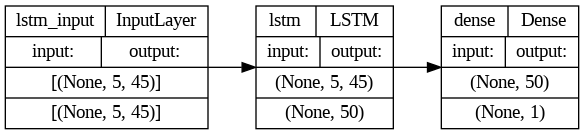

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model, show_shapes=True, rankdir="LR")

Using SHAP (SHapley Additive exPlanations) to explain the predictions of an LSTM (Long Short-Term Memory) model on a test dataset.

Length of expanded_feature_names: 235
Number of features in X_test_flattened: 225
There is a mismatch between the feature names and the flattened data.


  0%|          | 0/10 [00:00<?, ?it/s]

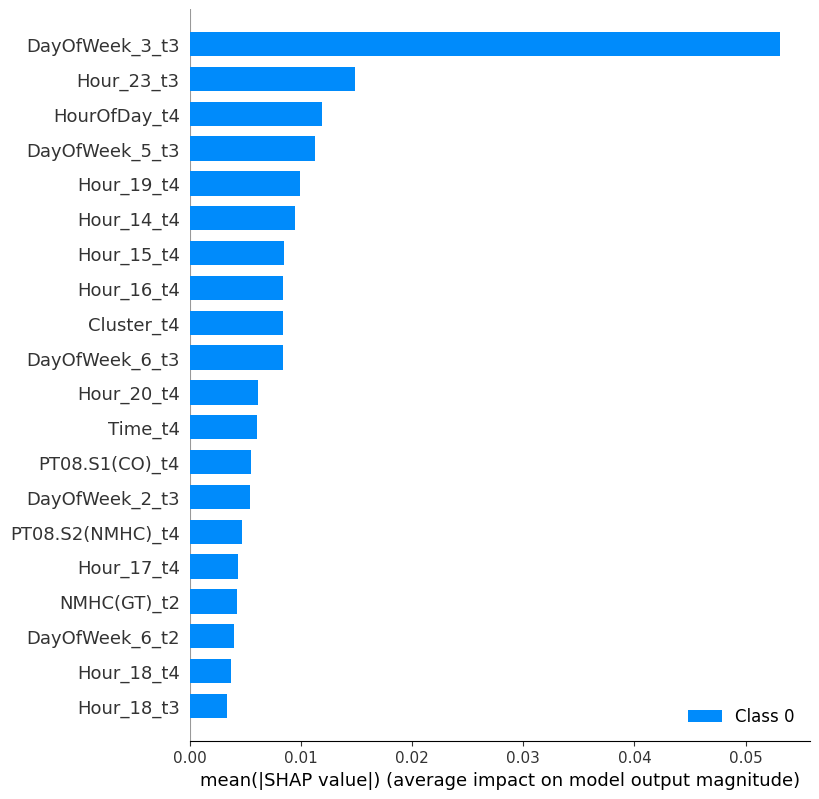

In [ ]:
#Initialize SHAP's JavaScript visualization library
shap.initjs()

# Flatten the sequences along the timesteps and features dimensions
X_test_flattened = X_test[:10].reshape(10, -1)

# Expand feature names to match the flattened shape
expanded_feature_names = [f"{name}_t{timestep}" for timestep in range(seq_length) for name in feature_names]
# Print the lengths to debug the issue
print(f"Length of expanded_feature_names: {len(expanded_feature_names)}")
print(f"Number of features in X_test_flattened: {X_test_flattened.shape[1]}")

# Verify the feature names and the data
if len(expanded_feature_names) != X_test_flattened.shape[1]:
    print("There is a mismatch between the feature names and the flattened data.")
    # Additional debug information can be printed here
    # For example, you could print both lists to see which features are missing/extra

# Define a wrapper function for model predictions
def lstm_predict_wrapper(model, data_2d):
    # Reshape the 2D data back into 3D sequences
    data_3d = data_2d.reshape(-1, X_train.shape[1], X_train.shape[2])
    # Use the model to make predictions on the 3D data
    return model.predict(data_3d)

# Use the wrapper function with KernelExplainer
explainer = shap.KernelExplainer(lambda x: lstm_predict_wrapper(model, x), X_train[:100].reshape(100, -1))

import numpy as np
np.int = int
np.str = str


# Generate SHAP values for the flattened test set
shap_values = explainer.shap_values(X_test_flattened)

# Visualize the SHAP values for the test set
shap.summary_plot(shap_values, X_test_flattened, feature_names=expanded_feature_names)

The bar chart represents the summary plot of the SHAP values for the test set. Each bar represents the average impact of a feature on the model's output, with the features listed on the y-axis and the mean(|SHAP value|), which indicates the average impact magnitude on the model output, on the x-axis.

Features are sorted by their impact, and we can see that NOx(GT)_t4 has the highest average SHAP value, indicating it has the largest average impact on the model's output magnitude for class 0 at timestep 4. The suffix _t4 or _t3 indicates the timestep of the sequence, showing that the model considers the temporal aspect of the features.

The force plot is a visualization tool that shows the impact of each feature on the prediction for a specific observation. In this plot, positive SHAP values are shown on the left side, while negative values are displayed on the right side, illustrating a kind of competition between them. The prediction for the observed data point is highlighted in the plot.

In [ ]:
# Truncate expanded_feature_names to match the number of SHAP values for the feature set
trimmed_feature_names = expanded_feature_names[:225]

#shap.force_plot(explainer.expected_value, shap_values[0][0], X_test_flattened[0], feature_names=expanded_feature_names)

print(f"Expected value shape: {np.shape(explainer.expected_value)}")
print(f"SHAP values shape: {np.shape(shap_values)}")
print(f"Number of features in flattened test data: {X_test_flattened.shape[1]}")
print(f"Number of feature names: {len(expanded_feature_names)}")


# Initialize SHAP's JavaScript visualization library
shap.initjs()

# Visualize the SHAP values for the first sequence
# Ensure that you're passing in the SHAP values for the first sample and feature set
# Use the first value of the expected value since it's wrapped in an array
shap.force_plot(
    explainer.expected_value[0],
    shap_values[0][0],  # Adjust this if you need to select a different sample or set of SHAP values
    X_test_flattened[0],
    feature_names=trimmed_feature_names
)


Expected value shape: (1,)
SHAP values shape: (1, 10, 225)
Number of features in flattened test data: 225
Number of feature names: 235
